<a href="https://colab.research.google.com/github/Jimbobaus/project---What-Watts---Group-A/blob/main/src/Sandpit_for_Capstone.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Sandpit for What Watts capstone project


In [1]:

!git clone https://github.com/Jimbobaus/project.git

fatal: destination path 'project' already exists and is not an empty directory.


In [2]:

# Fix: fatal: destination path 'project' already exists and is not an empty directory.
!git clone https://github.com/Jimbobaus/project.git temp
!cp temp/data/NSW\ Public\ Holidays.csv project/data
!ls project/data
# !mv temp/.git project/.git
# !rm -rf temp

fatal: destination path 'temp' already exists and is not an empty directory.
'ACT Per Month Installation.csv'
 forecastdemand_nsw.csv.zip.partaa
 forecastdemand_nsw.csv.zip.partab
'NSW Public Holidays.csv'
 pv_Canterbury_2010-01-01-2021-04-30.csv
'PV Cumulative Installation NSW&ACT.csv'
 PVGenerationNSW-2012_032021.csv
'pv_St Ives_2019-01-01-2021-04-30.csv'
 pv_Sutherland_2019-01-01-2021-04-30.csv
 temperature_nsw.csv.zip
 totaldemand_nsw.csv.zip


In [3]:

# Create a data folder
!mkdir -p data
# Joint forecastdemand_nsw files into a single file. 
!cat project/data/forecastdemand_nsw.csv.zip.part* > data/forecastdemand_nsw.csv.zip

In [4]:

!cp data/forecastdemand_nsw.csv.zip /content/What

In [5]:

# Unzip the data files into the data folder
!unzip -o data/forecastdemand_nsw.csv.zip -d data
!unzip -o project/data/temperature_nsw.csv.zip -d data
!unzip -o project/data/totaldemand_nsw.csv.zip -d data

# Remove forecastdemand_nsw.csv.zip
!rm data/forecastdemand_nsw.csv.zip

Archive:  data/forecastdemand_nsw.csv.zip
  inflating: data/forecastdemand_nsw.csv  
Archive:  project/data/temperature_nsw.csv.zip
  inflating: data/temperature_nsw.csv  
Archive:  project/data/totaldemand_nsw.csv.zip
  inflating: data/totaldemand_nsw.csv  


In [6]:
import os
b = os.path.getsize("/content/data/forecastdemand_nsw.csv")
c = os.path.getsize("/content/data/temperature_nsw.csv")
d = os.path.getsize("/content/data/totaldemand_nsw.csv")
print (b,c,d)

739632904 6877450 5796284


# Import required libraries

In [7]:

import pandas as pd
import numpy as np
import seaborn as sns                       #visualisation
import matplotlib.pyplot as plt             #visualisation
%matplotlib inline     
sns.set(color_codes=True)
from plotnine import *

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, cross_val_predict
from sklearn.tree import DecisionTreeClassifier, export_text
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score, classification_report
from sklearn import tree

#Load data  into data frames

## Forecast Demand

In [8]:

df_forecast = pd.read_csv("/content/data/forecastdemand_nsw.csv")
# To display the top 5 rows 
df_forecast.tail(100)


#df_forecast.info()

,PREDISPATCHSEQNO,REGIONID,PERIODID,FORECASTDEMAND,LASTCHANGED,DATETIME
10905919,2021031711,NSW1,29,7048.49,2021-03-17 09:01:10,2021-03-17 23:30:00
10905920,2021031712,NSW1,28,7043.37,2021-03-17 09:31:04,2021-03-17 23:30:00
10905921,2021031713,NSW1,27,7044.67,2021-03-17 10:01:17,2021-03-17 23:30:00
10905922,2021031714,NSW1,26,7043.56,2021-03-17 10:31:09,2021-03-17 23:30:00
10905923,2021031715,NSW1,25,7043.46,2021-03-17 11:01:00,2021-03-17 23:30:00
...,...,...,...,...,...,...
10906014,2021031736,NSW1,5,7028.45,2021-03-17 21:31:31,2021-03-18 00:00:00
10906015,2021031737,NSW1,4,7041.65,2021-03-17 22:01:34,2021-03-18 00:00:00
10906016,2021031738,NSW1,3,7087.60,2021-03-17 22:31:36,2021-03-18 00:00:00
10906017,2021031739,NSW1,2,7087.28,2021-03-17 23:01:36,2021-03-18 00:00:00


## Temperature

In [9]:


df_temp = pd.read_csv("/content/data/temperature_nsw.csv")
# To display the top 5 rows 
df_temp.head(50)

#df_temp.info()

,LOCATION,DATETIME,TEMPERATURE
0,Bankstown,1/1/2010 0:00,23.1
1,Bankstown,1/1/2010 0:01,23.1
2,Bankstown,1/1/2010 0:30,22.9
3,Bankstown,1/1/2010 0:50,22.7
4,Bankstown,1/1/2010 1:00,22.6
5,Bankstown,1/1/2010 1:30,22.5
6,Bankstown,1/1/2010 2:00,22.5
7,Bankstown,1/1/2010 2:30,22.4
8,Bankstown,1/1/2010 3:00,22.3
9,Bankstown,1/1/2010 3:30,22.3


## Total Demand

In [10]:

df_totaldemand = pd.read_csv("/content/data/totaldemand_nsw.csv")
# To display the top 5 rows 
df_totaldemand.tail(50)
#df_totaldemand.loc['2021-03-03']
#df_totaldemand.info()

,DATETIME,TOTALDEMAND,REGIONID
196463,16/3/2021 23:30,7056.88,NSW1
196464,17/3/2021 0:00,6999.23,NSW1
196465,17/3/2021 0:30,6849.85,NSW1
196466,17/3/2021 1:00,6618.34,NSW1
196467,17/3/2021 1:30,6353.34,NSW1
196468,17/3/2021 2:00,6155.11,NSW1
196469,17/3/2021 2:30,5999.40,NSW1
196470,17/3/2021 3:00,5964.12,NSW1
196471,17/3/2021 3:30,5981.55,NSW1
196472,17/3/2021 4:00,6051.72,NSW1


In [11]:

df_totaldemand.dtypes
#df_totaldemand.REGIONID.unique() # NSW1 only

DATETIME        object
TOTALDEMAND    float64
REGIONID        object
dtype: object

In [12]:

df_temp.dtypes
#df_temp.LOCATION.unique() # Bankstown only

LOCATION        object
DATETIME        object
TEMPERATURE    float64
dtype: object

In [13]:

df_forecast.dtypes 
#df_forecast.REGIONID.unique() # NSW1 only     

PREDISPATCHSEQNO      int64
REGIONID             object
PERIODID              int64
FORECASTDEMAND      float64
LASTCHANGED          object
DATETIME             object
dtype: object

In [14]:

print(df_totaldemand.isnull().sum())
print(df_temp.isnull().sum())
print(df_forecast.isnull().sum())

DATETIME       0
TOTALDEMAND    0
REGIONID       0
dtype: int64
LOCATION       0
DATETIME       0
TEMPERATURE    0
dtype: int64
PREDISPATCHSEQNO    0
REGIONID            0
PERIODID            0
FORECASTDEMAND      0
LASTCHANGED         0
DATETIME            0
dtype: int64


In [15]:

print(df_totaldemand.count)
print(df_temp.count)
print(df_forecast.count)

<bound method DataFrame.count of                DATETIME  TOTALDEMAND REGIONID
0         1/1/2010 0:00      8038.00     NSW1
1         1/1/2010 0:30      7809.31     NSW1
2         1/1/2010 1:00      7483.69     NSW1
3         1/1/2010 1:30      7117.23     NSW1
4         1/1/2010 2:00      6812.03     NSW1
...                 ...          ...      ...
196508  17/3/2021 22:00      7419.77     NSW1
196509  17/3/2021 22:30      7417.91     NSW1
196510  17/3/2021 23:00      7287.32     NSW1
196511  17/3/2021 23:30      7172.39     NSW1
196512   18/3/2021 0:00      7094.51     NSW1

[196513 rows x 3 columns]>
<bound method DataFrame.count of          LOCATION         DATETIME  TEMPERATURE
0       Bankstown    1/1/2010 0:00         23.1
1       Bankstown    1/1/2010 0:01         23.1
2       Bankstown    1/1/2010 0:30         22.9
3       Bankstown    1/1/2010 0:50         22.7
4       Bankstown    1/1/2010 1:00         22.6
...           ...              ...          ...
220321  Bankstown 

# Load additional data

## Public Holiday Data

In [16]:
# Load data
df_publicholidays = pd.read_csv("/content/project/data/NSW Public Holidays.csv", header=0,infer_datetime_format=True,parse_dates=[['Year','Date']])
df_publicholidays.rename(columns={'Year_Date' :'DATETIME'},inplace=True)

df_publicholidays = df_publicholidays.loc[(df_publicholidays['DATETIME'].dt.year >= 2012)] # EXCLUDE PRE-2012 DATA


#df_publicholidays['DATE'] = df_publicholidays['DATETIME']
df_publicholidays['PUBLICHOLIDAYS'] = 1 # 10000 change scale from 1 to 10000 for plot
df_publicholidays = df_publicholidays.set_index(['DATETIME'])

# Drop unused columns
df_publicholidays.drop(['Day','Holiday', 'Type', 'Other'], axis = 1, inplace=True)

df_publicholidays_merge = df_publicholidays.resample('1D').mean()
df_publicholidays_merge['PUBLICHOLIDAYS'] = df_publicholidays_merge['PUBLICHOLIDAYS'].fillna(0)

df_publicholidays_merge = df_publicholidays_merge.resample('30min').ffill()
df_publicholidays_merge



,PUBLICHOLIDAYS
DATETIME,
2012-01-01 00:00:00,1.0
2012-01-01 00:30:00,1.0
2012-01-01 01:00:00,1.0
2012-01-01 01:30:00,1.0
2012-01-01 02:00:00,1.0
...,...
2021-04-01 22:00:00,0.0
2021-04-01 22:30:00,0.0
2021-04-01 23:00:00,0.0


In [17]:
df_publicholidays_merge.loc['2012-01-02']

,PUBLICHOLIDAYS
DATETIME,
2012-01-02 00:00:00,0.0
2012-01-02 00:30:00,0.0
2012-01-02 01:00:00,0.0
2012-01-02 01:30:00,0.0
2012-01-02 02:00:00,0.0
2012-01-02 02:30:00,0.0
2012-01-02 03:00:00,0.0
2012-01-02 03:30:00,0.0
2012-01-02 04:00:00,0.0


## Rooftop Solar PV Data
Need to take an average of PV Yield (kWh) every 30 minutes

Canterbury (NSW) Data

In [18]:
df_solar_Canterbury = pd.read_csv("/content/project/data/pv_Canterbury_2010-01-01-2021-04-30.csv")
df_solar_Canterbury.dtypes

df_solar_Canterbury['Timestamp'] = pd.to_datetime(df_solar_Canterbury['Timestamp'])
df_solar_Canterbury['Date'] = df_solar_Canterbury['Timestamp'].dt.date
df_solar_Canterbury['Time'] = df_solar_Canterbury['Timestamp'].dt.time
df_solar_Canterbury['PV Yield (5KWp)'] = df_solar_Canterbury['PV Yield (kWh)']* 5/ 3.06 # Canterbury data PV Size is 3.06 KWp. Scaling it to 5KWp
df_solar_Canterbury['PV Yield (5KWp)'] = df_solar_Canterbury['PV Yield (5KWp)'].round(2)
df_solar_Canterbury = df_solar_Canterbury.set_index(['Timestamp'])
df_solar_Canterbury.tail(20)
df_solar_Canterbury.loc['2021-03-17']
#df_solar_Canterbury.dtypes

,Location,Irradiance (W/m2),System temperature (C),Nearest BOM station temperature (C),PV Yield (kWh),Date,Time,PV Yield (5KWp)
Timestamp,,,,,,,,
2021-03-17 07:00:00+10:00,Canterbury (NSW),NaN,NaN,18.4,0.014,2021-03-17,07:00:00,0.02
2021-03-17 08:00:00+10:00,Canterbury (NSW),NaN,NaN,19.3,0.162,2021-03-17,08:00:00,0.26
2021-03-17 09:00:00+10:00,Canterbury (NSW),NaN,NaN,19.4,0.431,2021-03-17,09:00:00,0.70
2021-03-17 10:00:00+10:00,Canterbury (NSW),NaN,NaN,21.3,0.298,2021-03-17,10:00:00,0.49
2021-03-17 11:00:00+10:00,Canterbury (NSW),NaN,NaN,21.9,0.533,2021-03-17,11:00:00,0.87
2021-03-17 12:00:00+10:00,Canterbury (NSW),NaN,NaN,22.6,0.806,2021-03-17,12:00:00,1.32
2021-03-17 13:00:00+10:00,Canterbury (NSW),NaN,NaN,22.3,0.867,2021-03-17,13:00:00,1.42
2021-03-17 14:00:00+10:00,Canterbury (NSW),NaN,NaN,20.3,1.134,2021-03-17,14:00:00,1.85
2021-03-17 15:00:00+10:00,Canterbury (NSW),NaN,NaN,21.1,0.517,2021-03-17,15:00:00,0.84


Sutherland (NSW) Data

In [19]:
df_solar_Sutherland = pd.read_csv("/content/project/data/pv_Sutherland_2019-01-01-2021-04-30.csv")
df_solar_Sutherland.dtypes

df_solar_Sutherland['Timestamp'] = pd.to_datetime(df_solar_Sutherland['Timestamp'])
df_solar_Sutherland['Date'] = df_solar_Sutherland['Timestamp'].dt.date
df_solar_Sutherland['Time'] = df_solar_Sutherland['Timestamp'].dt.time
df_solar_Sutherland['PV Yield (5KWp)'] = df_solar_Sutherland['PV Yield (kWh)']* 5/ 5.04 # Sutherland data PV Size is 5.04 KWp. Scaling it to 5KWp
df_solar_Sutherland['PV Yield (5KWp)'] = df_solar_Sutherland['PV Yield (5KWp)'].round(2)
df_solar_Sutherland = df_solar_Sutherland.set_index(['Timestamp'])
df_solar_Sutherland.head(10)

,Location,Irradiance (W/m2),System temperature (C),Nearest BOM station temperature (C),PV Yield (kWh),Date,Time,PV Yield (5KWp)
Timestamp,,,,,,,,
2019-01-01 05:00:00+10:00,Sutherland (NSW),NaN,NaN,21.0,0.000,2019-01-01,05:00:00,0.00
2019-01-01 06:00:00+10:00,Sutherland (NSW),NaN,NaN,22.1,0.085,2019-01-01,06:00:00,0.08
2019-01-01 07:00:00+10:00,Sutherland (NSW),NaN,NaN,24.4,0.455,2019-01-01,07:00:00,0.45
2019-01-01 08:00:00+10:00,Sutherland (NSW),NaN,NaN,26.6,1.618,2019-01-01,08:00:00,1.61
2019-01-01 09:00:00+10:00,Sutherland (NSW),NaN,NaN,29.1,2.561,2019-01-01,09:00:00,2.54
2019-01-01 10:00:00+10:00,Sutherland (NSW),NaN,NaN,31.0,3.266,2019-01-01,10:00:00,3.24
2019-01-01 11:00:00+10:00,Sutherland (NSW),NaN,NaN,31.3,3.744,2019-01-01,11:00:00,3.71
2019-01-01 12:00:00+10:00,Sutherland (NSW),NaN,NaN,31.9,3.930,2019-01-01,12:00:00,3.90
2019-01-01 13:00:00+10:00,Sutherland (NSW),NaN,NaN,32.4,3.855,2019-01-01,13:00:00,3.82


St Ives Data

In [20]:
df_solar_StIves = pd.read_csv("/content/project/data/pv_St Ives_2019-01-01-2021-04-30.csv")
df_solar_StIves.dtypes

df_solar_StIves['Timestamp'] = pd.to_datetime(df_solar_StIves['Timestamp'])
df_solar_StIves['Date'] = df_solar_StIves['Timestamp'].dt.date
df_solar_StIves['Time'] = df_solar_StIves['Timestamp'].dt.time
df_solar_StIves['PV Yield (5KWp)'] = df_solar_StIves['PV Yield (kWh)']* 5/ 5.1 # St Ives data PV Size is 5.1 KWp. Scaling it to 5KWp
df_solar_StIves['PV Yield (5KWp)'] = df_solar_StIves['PV Yield (5KWp)'].round(2)
df_solar_StIves = df_solar_StIves.set_index(['Timestamp'])
df_solar_StIves.head(10)

,Location,Irradiance (W/m2),System temperature (C),Nearest BOM station temperature (C),PV Yield (kWh),Date,Time,PV Yield (5KWp)
Timestamp,,,,,,,,
2020-03-22 11:00:00+10:00,St Ives (NSW),NaN,NaN,25.0,3.370,2020-03-22,11:00:00,3.30
2020-03-22 12:00:00+10:00,St Ives (NSW),NaN,NaN,26.4,3.537,2020-03-22,12:00:00,3.47
2020-03-22 13:00:00+10:00,St Ives (NSW),NaN,NaN,26.8,3.559,2020-03-22,13:00:00,3.49
2020-03-22 14:00:00+10:00,St Ives (NSW),NaN,NaN,28.0,2.596,2020-03-22,14:00:00,2.55
2020-03-22 15:00:00+10:00,St Ives (NSW),NaN,NaN,25.2,2.791,2020-03-22,15:00:00,2.74
2020-03-22 16:00:00+10:00,St Ives (NSW),NaN,NaN,23.1,1.850,2020-03-22,16:00:00,1.81
2020-03-22 17:00:00+10:00,St Ives (NSW),NaN,NaN,21.7,1.007,2020-03-22,17:00:00,0.99
2020-03-22 18:00:00+10:00,St Ives (NSW),NaN,NaN,20.0,0.214,2020-03-22,18:00:00,0.21
2020-03-22 19:00:00+10:00,St Ives (NSW),NaN,NaN,19.8,0.002,2020-03-22,19:00:00,0.00


PV Installation Szie (NSW)

In [21]:
# df_Solar_Installation_NSW = pd.read_csv("/content/project/data/PV installation Size-NSW.csv")
# #df_Solar_Installation_NSW.sum(level='Month')
# #df_Solar_Installation_NSW['TotalCapacityMW']= df_Solar_Installation_NSW.sum(level=0)
# #list_name= list(df_Solar_Installation_NSW)
# #print(list_name)
# #list_name.remove('Month')
# #df_Solar_Installation_NSW['TotalCapacityMW']= df_Solar_Installation_NSW.loc[:,list_name].sum(axis=1)/1000

# df_Solar_Installation_NSW['TotalCapacityMW']= df_Solar_Installation_NSW.sum(axis=1)/1000
# df_Solar_Installation_NSW.head(10)


PV data plotting

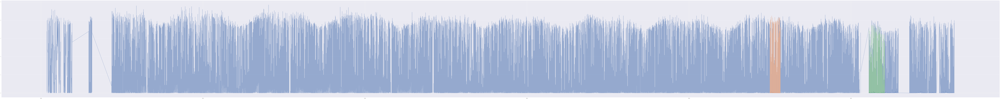

In [22]:
fig = plt.figure(figsize=(300,30))
for frame in [df_solar_Canterbury, df_solar_Sutherland, df_solar_StIves]:
  #plt.plot(frame['Date'], frame['PV Yield (kWh)'])
  plt.plot(frame['Date'], frame['PV Yield (5KWp)'])
  plt.show




###NSW PV System Generation - Final PV dataset

In [23]:
df_pv = pd.read_csv("/content/project/data/PVGenerationNSW-2012_032021.csv")

# Format date time
format = '%d/%m/%Y %H:%M'
df_pv['DateTime'] = pd.to_datetime(df_pv['DateTime'], format=format)
df_pv = df_pv.set_index(pd.DatetimeIndex(df_pv['DateTime']))

# Rename index column
# df_pv.rename(columns={'DateTime' :'DATETIME'},inplace=True)
df_pv.rename_axis("DATETIME", axis='index', inplace=True)

# Drop columns, only need PVGeneration(MW)
df_pv.drop(['DateTime','Date', 'Time', 'Nearest BOM station temperature (C)','PV Yield KWh (5KWp System)','NSWTotalSize(MW)'], axis= 1, inplace= True)


df_pv


,PVGeneration(MW)
DATETIME,
2021-03-24 00:00:00,0
2021-03-24 00:30:00,0
2021-03-24 01:00:00,0
2021-03-24 01:30:00,0
2021-03-24 02:00:00,0
...,...
2021-03-23 21:30:00,0
2021-03-23 22:00:00,0
2021-03-23 22:30:00,0


# EDA Pre-Transformation

## Forecast Demand

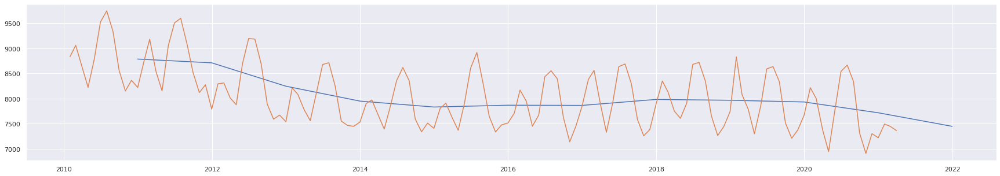

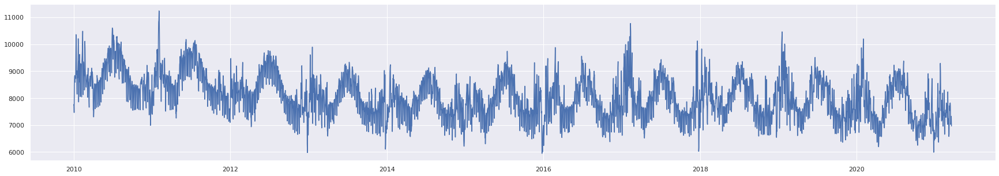

In [24]:

# This read_csv will truncate time so create as a new dataframe
df_forecast_eda =pd.read_csv("/content/data/forecastdemand_nsw.csv",header=0,infer_datetime_format=True,parse_dates=['DATETIME'],index_col=['DATETIME'])
#df_forecast_eda.head(10)

# Plot resampling by month and year
df_forecast_eda_eda_year =df_forecast_eda.resample('Y').mean()
plt.figure(figsize=(30,5))
plt.plot(df_forecast_eda_eda_year['FORECASTDEMAND'])

df_forecast_eda_eda_month =df_forecast_eda.resample('M').mean()
#plt.figure(figsize=(30,10))
plt.plot(df_forecast_eda_eda_month['FORECASTDEMAND'])

# Plot resampling by day
df_forecast_eda_eda_day =df_forecast_eda.resample('D').mean()


plt.figure(figsize=(30,5))
plt.plot(df_forecast_eda_eda_day['FORECASTDEMAND'])
#df_forecast_eda_eda_day.head(10)



## Temperature

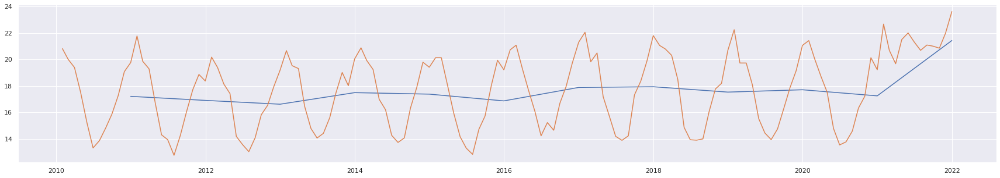

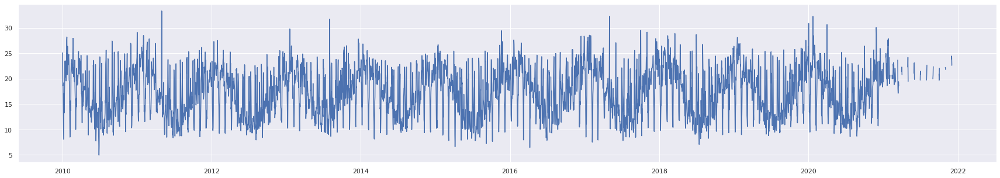

In [25]:

# This read_csv will truncate time so create as a new dataframe
df_temp_eda =pd.read_csv("/content/data/temperature_nsw.csv",header=0,infer_datetime_format=True,parse_dates=['DATETIME'],index_col=['DATETIME'])
df_temp_eda.head(10)
# Plot resampling by month and year
df_temp_eda_eda_year =df_temp_eda.resample('Y').mean()
plt.figure(figsize=(30,5))
plt.plot(df_temp_eda_eda_year['TEMPERATURE'])

df_temp_eda_eda_month =df_temp_eda.resample('M').mean()
#plt.figure(figsize=(30,10))
plt.plot(df_temp_eda_eda_month['TEMPERATURE'])

# Plot resampling by day
df_temp_eda_eda_day =df_temp_eda.resample('D').mean()
plt.figure(figsize=(30,5))
plt.plot(df_temp_eda_eda_day['TEMPERATURE'])

## Total Demand

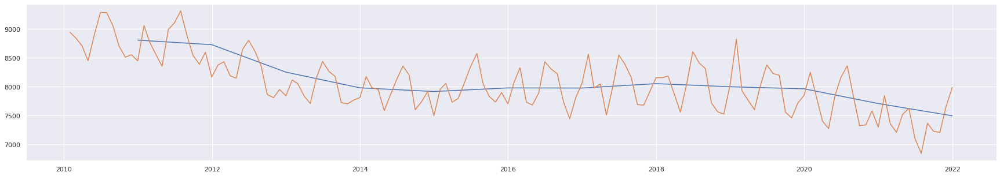

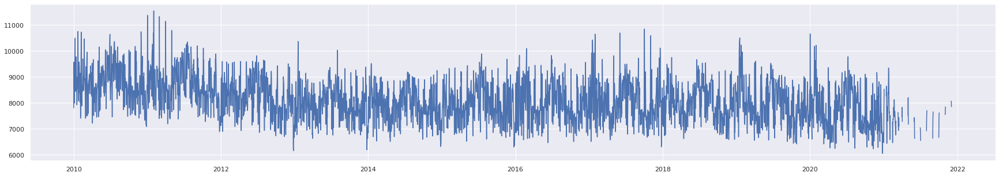

In [26]:

# This read_csv will truncate time so create as a new dataframe
df_totaldemand_eda =pd.read_csv("/content/data/totaldemand_nsw.csv",header=0,infer_datetime_format=True,parse_dates=['DATETIME'],index_col=['DATETIME'])

# Plot resampling by month and year
df_totaldemand_eda_eda_year =df_totaldemand_eda.resample('Y').mean()
plt.figure(figsize=(30,5))
plt.plot(df_totaldemand_eda_eda_year['TOTALDEMAND'])

df_totaldemand_eda_eda_month =df_totaldemand_eda.resample('M').mean()
#plt.figure(figsize=(30,10))
plt.plot(df_totaldemand_eda_eda_month['TOTALDEMAND'])

# Plot resampling by day
df_totaldemand_eda_eda_day =df_totaldemand_eda.resample('D').mean()
plt.figure(figsize=(30,5))
plt.plot(df_totaldemand_eda_eda_day['TOTALDEMAND'])

## Boxplot to find outliers
For any outliers, may need to replace with NaN (subject to further investigation)

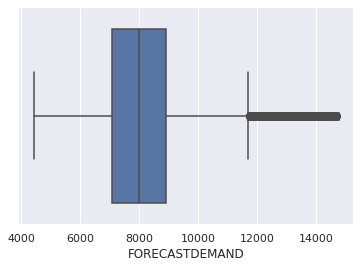

In [27]:

sns.boxplot(x=df_forecast['FORECASTDEMAND'])
plt.show()

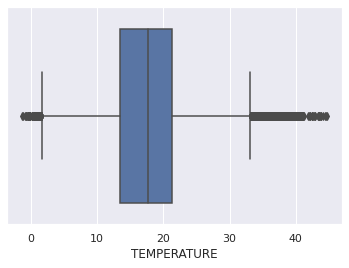

In [28]:

sns.boxplot(x=df_temp['TEMPERATURE'])
plt.show()

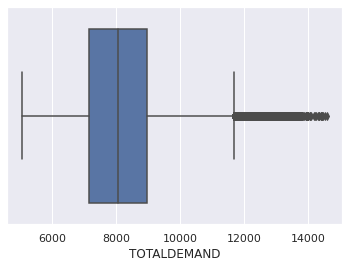

In [29]:

sns.boxplot(x=df_totaldemand['TOTALDEMAND'])
plt.show()

## Histogram 

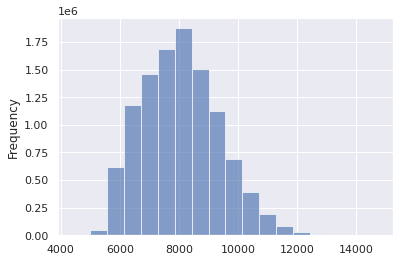

In [30]:

ax = df_forecast['FORECASTDEMAND'].plot.hist(bins=18, alpha=0.65)

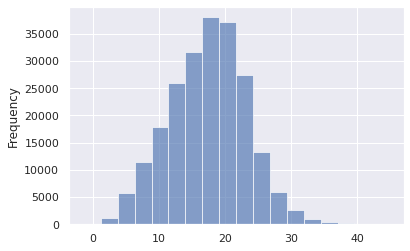

In [31]:

ax = df_temp['TEMPERATURE'].plot.hist(bins=18, alpha=0.65)

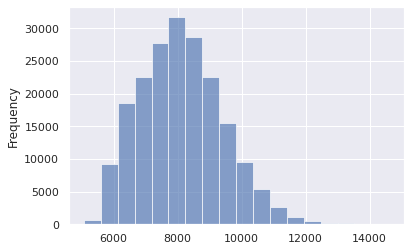

In [32]:

ax = df_totaldemand['TOTALDEMAND'].plot.hist(bins=18, alpha=0.65)

## Distribution

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Forecast Demand Distribution')

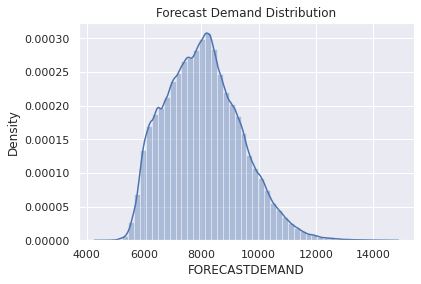

In [33]:

sns.distplot(df_forecast["FORECASTDEMAND"])
plt.title("Forecast Demand Distribution")

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Total Demand Distribution')

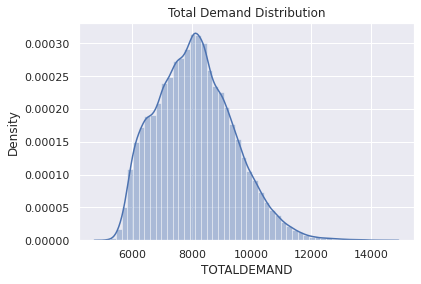

In [34]:

sns.distplot(df_totaldemand["TOTALDEMAND"])
plt.title("Total Demand Distribution")

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Temperature Distribution')

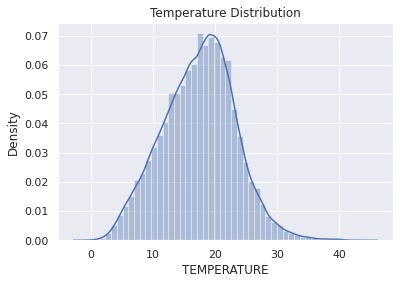

In [35]:

sns.distplot(df_temp["TEMPERATURE"])
plt.title("Temperature Distribution")

# Transformation
Transformation includes following:
* Set datetime column as an index
* Convert datetime column from string to date time
* Splitting date and time columns
* Adding month, year, day name, week
* Adding public holidays (currently data.gov h as only far back to 2014, not 2010)

## Forecast Demand
* Filter to use only data form year 2012 onwards

### Main Transformation

In [36]:

# df_forecast = pd.read_csv("/content/data/forecastdemand_nsw.csv")

# Adding date, time, month, year, day for Forecast data
df_forecast['DATETIME'] = pd.to_datetime(df_forecast['DATETIME'])
df_forecast['Date'] = df_forecast['DATETIME'].dt.date
df_forecast['Time'] = df_forecast['DATETIME'].dt.time
df_forecast['Hour'] = df_forecast['DATETIME'].dt.hour  # Hour minute feautre to forecast this as categorical
df_forecast['Hour'] =  df_forecast['Hour'].astype(str)
df_forecast['Minute'] = df_forecast['DATETIME'].dt.minute
df_forecast['MINUTE_CAT'] = df_forecast['Minute'] 
df_forecast['Minute'] =  df_forecast['Minute'].astype(str)
df_forecast['HOURMINUTE'] = df_forecast['Hour'] + '-' + df_forecast['Minute']
df_forecast['Year'] = df_forecast['DATETIME'].dt.year 
df_forecast['Month'] = pd.to_numeric(df_forecast['DATETIME'].dt.month)
df_forecast['Day'] = df_forecast['DATETIME'].dt.day
df_forecast['Day_Name'] = df_forecast['DATETIME'].dt.day_name()
df_forecast['DayOfWeek'] = pd.to_numeric(df_forecast['DATETIME'].dt.dayofweek)
df_forecast = df_forecast.set_index(['DATETIME'])

### Filter data from Year 2012 onwards 

In [37]:

# Filter to use only data from year 2012 onwards
df_forecast = df_forecast.loc[(df_forecast['Year'] >= 2012)]

#df_forecast.tail(10)
#df_forecast.loc['2020-03-01']
df_forecast
#df_forecast.loc['2020-03'].groupby(['Date','REGIONID','Year','Month','Day']).mean()

,PREDISPATCHSEQNO,REGIONID,PERIODID,FORECASTDEMAND,LASTCHANGED,Date,Time,Hour,Minute,MINUTE_CAT,HOURMINUTE,Year,Month,Day,Day_Name,DayOfWeek
DATETIME,,,,,,,,,,,,,,,,
2012-01-01,2011123018,NSW1,71,7005.23,2011-12-30 12:31:33,2012-01-01,00:00:00,0,0,0,0-0,2012,1,1,Sunday,6
2012-01-01,2011123019,NSW1,70,7002.90,2011-12-30 13:01:29,2012-01-01,00:00:00,0,0,0,0-0,2012,1,1,Sunday,6
2012-01-01,2011123020,NSW1,69,7001.91,2011-12-30 13:31:24,2012-01-01,00:00:00,0,0,0,0-0,2012,1,1,Sunday,6
2012-01-01,2011123021,NSW1,68,6993.53,2011-12-30 14:01:16,2012-01-01,00:00:00,0,0,0,0-0,2012,1,1,Sunday,6
2012-01-01,2011123022,NSW1,67,6992.64,2011-12-30 14:31:23,2012-01-01,00:00:00,0,0,0,0-0,2012,1,1,Sunday,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-18,2021031736,NSW1,5,7028.45,2021-03-17 21:31:31,2021-03-18,00:00:00,0,0,0,0-0,2021,3,18,Thursday,3
2021-03-18,2021031737,NSW1,4,7041.65,2021-03-17 22:01:34,2021-03-18,00:00:00,0,0,0,0-0,2021,3,18,Thursday,3
2021-03-18,2021031738,NSW1,3,7087.60,2021-03-17 22:31:36,2021-03-18,00:00:00,0,0,0,0-0,2021,3,18,Thursday,3


### Weekday Weekend (Categorical data) 

In [38]:

# Adding & Grouping weekday, weekend to categorical column
def weekday_weekend_list(df) :
    if df['DayOfWeek'] <= 4 :
        return 'weekday'
    else:
        return 'weekend'

df_forecast['weekday_weekend'] = df_forecast.apply(lambda df_forecast:weekday_weekend_list(df_forecast), axis=1)

# Drop tenture original before grouping column
# df_forecast.drop("DayOfWeek", axis= 1, inplace= True)

df_forecast

,PREDISPATCHSEQNO,REGIONID,PERIODID,FORECASTDEMAND,LASTCHANGED,Date,Time,Hour,Minute,MINUTE_CAT,HOURMINUTE,Year,Month,Day,Day_Name,DayOfWeek,weekday_weekend
DATETIME,,,,,,,,,,,,,,,,,
2012-01-01,2011123018,NSW1,71,7005.23,2011-12-30 12:31:33,2012-01-01,00:00:00,0,0,0,0-0,2012,1,1,Sunday,6,weekend
2012-01-01,2011123019,NSW1,70,7002.90,2011-12-30 13:01:29,2012-01-01,00:00:00,0,0,0,0-0,2012,1,1,Sunday,6,weekend
2012-01-01,2011123020,NSW1,69,7001.91,2011-12-30 13:31:24,2012-01-01,00:00:00,0,0,0,0-0,2012,1,1,Sunday,6,weekend
2012-01-01,2011123021,NSW1,68,6993.53,2011-12-30 14:01:16,2012-01-01,00:00:00,0,0,0,0-0,2012,1,1,Sunday,6,weekend
2012-01-01,2011123022,NSW1,67,6992.64,2011-12-30 14:31:23,2012-01-01,00:00:00,0,0,0,0-0,2012,1,1,Sunday,6,weekend
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-18,2021031736,NSW1,5,7028.45,2021-03-17 21:31:31,2021-03-18,00:00:00,0,0,0,0-0,2021,3,18,Thursday,3,weekday
2021-03-18,2021031737,NSW1,4,7041.65,2021-03-17 22:01:34,2021-03-18,00:00:00,0,0,0,0-0,2021,3,18,Thursday,3,weekday
2021-03-18,2021031738,NSW1,3,7087.60,2021-03-17 22:31:36,2021-03-18,00:00:00,0,0,0,0-0,2021,3,18,Thursday,3,weekday


### Seasons (Categorical data)

In [39]:

# Adding & Grouping seasons categorical columns
def season_list(df) :
    if (3 <= df['Month']) & (df['Month'] <= 5) :
        return 'autumn'
    if (6 <= df['Month']) & (df['Month'] <= 8) :
        return 'winter'
    if (9 <= df['Month']) & (df['Month'] <= 11) :
        return 'spring'        
    else:
        return 'summer'

df_forecast['SEASON'] = df_forecast.apply(lambda df_forecast:season_list(df_forecast), axis=1)

# Drop tenture original before grouping column
# df_forecast.drop("DayOfWeek", axis= 1, inplace= True)

df_forecast

#ggplot(df_forecast, aes(x='Day_Name', y='FORECASTDEMAND', color = 'Year')) + geom_point()

,PREDISPATCHSEQNO,REGIONID,PERIODID,FORECASTDEMAND,LASTCHANGED,Date,Time,Hour,Minute,MINUTE_CAT,HOURMINUTE,Year,Month,Day,Day_Name,DayOfWeek,weekday_weekend,SEASON
DATETIME,,,,,,,,,,,,,,,,,,
2012-01-01,2011123018,NSW1,71,7005.23,2011-12-30 12:31:33,2012-01-01,00:00:00,0,0,0,0-0,2012,1,1,Sunday,6,weekend,summer
2012-01-01,2011123019,NSW1,70,7002.90,2011-12-30 13:01:29,2012-01-01,00:00:00,0,0,0,0-0,2012,1,1,Sunday,6,weekend,summer
2012-01-01,2011123020,NSW1,69,7001.91,2011-12-30 13:31:24,2012-01-01,00:00:00,0,0,0,0-0,2012,1,1,Sunday,6,weekend,summer
2012-01-01,2011123021,NSW1,68,6993.53,2011-12-30 14:01:16,2012-01-01,00:00:00,0,0,0,0-0,2012,1,1,Sunday,6,weekend,summer
2012-01-01,2011123022,NSW1,67,6992.64,2011-12-30 14:31:23,2012-01-01,00:00:00,0,0,0,0-0,2012,1,1,Sunday,6,weekend,summer
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-18,2021031736,NSW1,5,7028.45,2021-03-17 21:31:31,2021-03-18,00:00:00,0,0,0,0-0,2021,3,18,Thursday,3,weekday,autumn
2021-03-18,2021031737,NSW1,4,7041.65,2021-03-17 22:01:34,2021-03-18,00:00:00,0,0,0,0-0,2021,3,18,Thursday,3,weekday,autumn
2021-03-18,2021031738,NSW1,3,7087.60,2021-03-17 22:31:36,2021-03-18,00:00:00,0,0,0,0-0,2021,3,18,Thursday,3,weekday,autumn


### Minute 0 or 30 minute (Categorical data) 
* Minute O'clock and half (0 or 30 minute) vs non 0 or 30 minute (Categorical data) 

In [40]:

# Adding 0 or 30 minutes to categorical column
def oclock_list(df) :
    if df['MINUTE_CAT'] == 0 :
        return 'oclock'
    elif df['MINUTE_CAT'] == 30 :
        return 'oclock'
    else:
        return 'non_oclock'


df_forecast['OCLOCK'] = df_forecast.apply(lambda df_forecast:oclock_list(df_forecast), axis=1)

df_forecast

,PREDISPATCHSEQNO,REGIONID,PERIODID,FORECASTDEMAND,LASTCHANGED,Date,Time,Hour,Minute,MINUTE_CAT,HOURMINUTE,Year,Month,Day,Day_Name,DayOfWeek,weekday_weekend,SEASON,OCLOCK
DATETIME,,,,,,,,,,,,,,,,,,,
2012-01-01,2011123018,NSW1,71,7005.23,2011-12-30 12:31:33,2012-01-01,00:00:00,0,0,0,0-0,2012,1,1,Sunday,6,weekend,summer,oclock
2012-01-01,2011123019,NSW1,70,7002.90,2011-12-30 13:01:29,2012-01-01,00:00:00,0,0,0,0-0,2012,1,1,Sunday,6,weekend,summer,oclock
2012-01-01,2011123020,NSW1,69,7001.91,2011-12-30 13:31:24,2012-01-01,00:00:00,0,0,0,0-0,2012,1,1,Sunday,6,weekend,summer,oclock
2012-01-01,2011123021,NSW1,68,6993.53,2011-12-30 14:01:16,2012-01-01,00:00:00,0,0,0,0-0,2012,1,1,Sunday,6,weekend,summer,oclock
2012-01-01,2011123022,NSW1,67,6992.64,2011-12-30 14:31:23,2012-01-01,00:00:00,0,0,0,0-0,2012,1,1,Sunday,6,weekend,summer,oclock
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-18,2021031736,NSW1,5,7028.45,2021-03-17 21:31:31,2021-03-18,00:00:00,0,0,0,0-0,2021,3,18,Thursday,3,weekday,autumn,oclock
2021-03-18,2021031737,NSW1,4,7041.65,2021-03-17 22:01:34,2021-03-18,00:00:00,0,0,0,0-0,2021,3,18,Thursday,3,weekday,autumn,oclock
2021-03-18,2021031738,NSW1,3,7087.60,2021-03-17 22:31:36,2021-03-18,00:00:00,0,0,0,0-0,2021,3,18,Thursday,3,weekday,autumn,oclock


In [41]:

df_forecast['2021-03-13']

,PREDISPATCHSEQNO,REGIONID,PERIODID,FORECASTDEMAND,LASTCHANGED,Date,Time,Hour,Minute,MINUTE_CAT,HOURMINUTE,Year,Month,Day,Day_Name,DayOfWeek,weekday_weekend,SEASON,OCLOCK
DATETIME,,,,,,,,,,,,,,,,,,,
2021-03-13 00:00:00,2021031118,NSW1,71,7370.05,2021-03-11 12:32:12,2021-03-13,00:00:00,0,0,0,0-0,2021,3,13,Saturday,5,weekend,autumn,oclock
2021-03-13 00:00:00,2021031119,NSW1,70,7370.23,2021-03-11 13:02:05,2021-03-13,00:00:00,0,0,0,0-0,2021,3,13,Saturday,5,weekend,autumn,oclock
2021-03-13 00:00:00,2021031120,NSW1,69,7370.88,2021-03-11 13:31:49,2021-03-13,00:00:00,0,0,0,0-0,2021,3,13,Saturday,5,weekend,autumn,oclock
2021-03-13 00:00:00,2021031121,NSW1,68,7376.51,2021-03-11 14:01:46,2021-03-13,00:00:00,0,0,0,0-0,2021,3,13,Saturday,5,weekend,autumn,oclock
2021-03-13 00:00:00,2021031122,NSW1,67,7373.12,2021-03-11 14:31:44,2021-03-13,00:00:00,0,0,0,0-0,2021,3,13,Saturday,5,weekend,autumn,oclock
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-13 23:30:00,2021031335,NSW1,5,7459.43,2021-03-13 21:01:39,2021-03-13,23:30:00,23,30,30,23-30,2021,3,13,Saturday,5,weekend,autumn,oclock
2021-03-13 23:30:00,2021031336,NSW1,4,7479.80,2021-03-13 21:31:42,2021-03-13,23:30:00,23,30,30,23-30,2021,3,13,Saturday,5,weekend,autumn,oclock
2021-03-13 23:30:00,2021031337,NSW1,3,7532.53,2021-03-13 22:01:43,2021-03-13,23:30:00,23,30,30,23-30,2021,3,13,Saturday,5,weekend,autumn,oclock


## Temperature

In [42]:

#df_temp = pd.read_csv("/content/data/temperature_nsw.csv")

#df_temp = df_temp_eda 
#df_temp

# Format date time
format = '%d/%m/%Y %H:%M'
df_temp['DATETIME'] = pd.to_datetime(df_temp['DATETIME'], format=format)
df_temp = df_temp.set_index(pd.DatetimeIndex(df_temp['DATETIME']))

df_temp

# Adding date, time for rollup before merge
# df_temp['DATETIME'] = pd.to_datetime(df_temp['DATETIME'])
df_temp['Date'] = df_temp['DATETIME'].dt.date
df_temp['Time'] = df_temp['DATETIME'].dt.time
df_temp['Hour'] = df_temp['DATETIME'].dt.hour
df_temp['Minute'] = df_temp['DATETIME'].dt.minute
# df_temp = df_temp.set_index(['DATETIME'])
df_temp

,LOCATION,DATETIME,TEMPERATURE,Date,Time,Hour,Minute
DATETIME,,,,,,,
2010-01-01 00:00:00,Bankstown,2010-01-01 00:00:00,23.1,2010-01-01,00:00:00,0,0
2010-01-01 00:01:00,Bankstown,2010-01-01 00:01:00,23.1,2010-01-01,00:01:00,0,1
2010-01-01 00:30:00,Bankstown,2010-01-01 00:30:00,22.9,2010-01-01,00:30:00,0,30
2010-01-01 00:50:00,Bankstown,2010-01-01 00:50:00,22.7,2010-01-01,00:50:00,0,50
2010-01-01 01:00:00,Bankstown,2010-01-01 01:00:00,22.6,2010-01-01,01:00:00,1,0
...,...,...,...,...,...,...,...
2021-03-17 23:00:00,Bankstown,2021-03-17 23:00:00,19.1,2021-03-17,23:00:00,23,0
2021-03-17 23:20:00,Bankstown,2021-03-17 23:20:00,19.0,2021-03-17,23:20:00,23,20
2021-03-17 23:30:00,Bankstown,2021-03-17 23:30:00,18.8,2021-03-17,23:30:00,23,30


### High Medium Low Temperature (Categorical data)

In [43]:

# Adding & Grouping seasons categorical columns
def temp_list(df) :
    if (df['TEMPERATURE'] < 10) :
        return "verylow" #'1 very low'
    if (df['TEMPERATURE'] >= 10) & (df['TEMPERATURE'] < 20) :
        return "low" #'2 low'
    if (df['TEMPERATURE'] >= 20) & (df['TEMPERATURE'] < 30) :
        return "high" #'3 high'
    else:
        return "veryhigh" #'3 very high >= 30'

df_temp['TEMPERATURERANGES'] = df_temp.apply(lambda df_temp:temp_list(df_temp), axis=1)

df_temp

,LOCATION,DATETIME,TEMPERATURE,Date,Time,Hour,Minute,TEMPERATURERANGES
DATETIME,,,,,,,,
2010-01-01 00:00:00,Bankstown,2010-01-01 00:00:00,23.1,2010-01-01,00:00:00,0,0,high
2010-01-01 00:01:00,Bankstown,2010-01-01 00:01:00,23.1,2010-01-01,00:01:00,0,1,high
2010-01-01 00:30:00,Bankstown,2010-01-01 00:30:00,22.9,2010-01-01,00:30:00,0,30,high
2010-01-01 00:50:00,Bankstown,2010-01-01 00:50:00,22.7,2010-01-01,00:50:00,0,50,high
2010-01-01 01:00:00,Bankstown,2010-01-01 01:00:00,22.6,2010-01-01,01:00:00,1,0,high
...,...,...,...,...,...,...,...,...
2021-03-17 23:00:00,Bankstown,2021-03-17 23:00:00,19.1,2021-03-17,23:00:00,23,0,low
2021-03-17 23:20:00,Bankstown,2021-03-17 23:20:00,19.0,2021-03-17,23:20:00,23,20,low
2021-03-17 23:30:00,Bankstown,2021-03-17 23:30:00,18.8,2021-03-17,23:30:00,23,30,low


In [44]:

# # Adding & Grouping seasons categorical columns
# def temp_list(df) :
#     if (df['TEMPERATURE'] < 10) :
#         return 1 #'low'
#     if (df['TEMPERATURE'] > 30) :
#         return 3 #'high'
#     else:
#         return 2 #'medium'

# df_temp['TEMPERATURERANGES'] = df_temp.apply(lambda df_temp:temp_list(df_temp), axis=1)

# df_temp

## Total Demand

In [45]:

#df_totaldemand = df_totaldemand_eda

#df_totaldemand = pd.read_csv("/content/data/totaldemand_nsw.csv")
# Format date time
format = '%d/%m/%Y %H:%M'
df_totaldemand['DATETIME'] = pd.to_datetime(df_totaldemand['DATETIME'], format=format)
#df_totaldemand = df_totaldemand.set_index(pd.DatetimeIndex(df_totaldemand['DATETIME']))
df_totaldemand = df_totaldemand.set_index(['DATETIME'])

df_totaldemand

,TOTALDEMAND,REGIONID
DATETIME,,
2010-01-01 00:00:00,8038.00,NSW1
2010-01-01 00:30:00,7809.31,NSW1
2010-01-01 01:00:00,7483.69,NSW1
2010-01-01 01:30:00,7117.23,NSW1
2010-01-01 02:00:00,6812.03,NSW1
...,...,...
2021-03-17 22:00:00,7419.77,NSW1
2021-03-17 22:30:00,7417.91,NSW1
2021-03-17 23:00:00,7287.32,NSW1


# Merge all dataframes
To merge 3 dataframes into one dataframe, below tranformation required when merge.
From: 2010-01-01
To: 2021-03-18

1. Forecast demand
* Data with date time every 30 minutes, multiple data points for each time
* The last data point to be taken
2. Temperature
* Data with date time every 30 minutes (some inconsistent), multiple data points for each time
* Average data to be taken
3. Total demand
* Data with date time every 30 minutes

## Forecast Demand
Rollup to get last changed per date time

In [46]:

# Before Merge
#df_forecast_merge = df_forecast.loc['2020-03-01']
df_forecast_merge = df_forecast

# Multiple data poitns pick only the last one using over partition rank by periodid

df_forecast_merge['rank_periodid'] = df_forecast_merge.groupby('DATETIME')['PERIODID'].rank(method='first')

df_forecast_merge = df_forecast_merge[df_forecast_merge['rank_periodid']==1]
df_forecast_merge

,PREDISPATCHSEQNO,REGIONID,PERIODID,FORECASTDEMAND,LASTCHANGED,Date,Time,Hour,Minute,MINUTE_CAT,HOURMINUTE,Year,Month,Day,Day_Name,DayOfWeek,weekday_weekend,SEASON,OCLOCK,rank_periodid
DATETIME,,,,,,,,,,,,,,,,,,,,
2012-01-01 00:00:00,2011123140,NSW1,1,7073.47,2011-12-31 23:31:01,2012-01-01,00:00:00,0,0,0,0-0,2012,1,1,Sunday,6,weekend,summer,oclock,1.0
2012-01-01 00:30:00,2011123141,NSW1,1,6938.19,2012-01-01 00:01:07,2012-01-01,00:30:00,0,30,30,0-30,2012,1,1,Sunday,6,weekend,summer,oclock,1.0
2012-01-01 01:00:00,2011123142,NSW1,1,6820.57,2012-01-01 00:30:58,2012-01-01,01:00:00,1,0,0,1-0,2012,1,1,Sunday,6,weekend,summer,oclock,1.0
2012-01-01 01:30:00,2011123143,NSW1,1,6564.27,2012-01-01 01:01:02,2012-01-01,01:30:00,1,30,30,1-30,2012,1,1,Sunday,6,weekend,summer,oclock,1.0
2012-01-01 02:00:00,2011123144,NSW1,1,6337.37,2012-01-01 01:31:06,2012-01-01,02:00:00,2,0,0,2-0,2012,1,1,Sunday,6,weekend,summer,oclock,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-17 22:00:00,2021031736,NSW1,1,7409.33,2021-03-17 21:31:31,2021-03-17,22:00:00,22,0,0,22-0,2021,3,17,Wednesday,2,weekday,autumn,oclock,1.0
2021-03-17 22:30:00,2021031737,NSW1,1,7422.63,2021-03-17 22:01:34,2021-03-17,22:30:00,22,30,30,22-30,2021,3,17,Wednesday,2,weekday,autumn,oclock,1.0
2021-03-17 23:00:00,2021031738,NSW1,1,7313.13,2021-03-17 22:31:36,2021-03-17,23:00:00,23,0,0,23-0,2021,3,17,Wednesday,2,weekday,autumn,oclock,1.0


## Temperature
Rollup for non 00:00 or 00:30:  
between 00:00 and < 00:30 => 00:00 
between 00:30 and < 00:59 => 00:30 

In [47]:

#df_temp = pd.read_csv("/content/data/temperature_nsw.csv")
#df_temp =pd.read_csv("/content/data/temperature_nsw.csv",header=0,infer_datetime_format=True,parse_dates=['DATETIME'],index_col=['DATETIME'])


# # Format date time
# format = '%d/%m/%Y %H:%M'
# df_temp['DATETIME'] = pd.to_datetime(df_temp['DATETIME'], format=format)
# df_temp = df_temp.set_index(pd.DatetimeIndex(df_temp['DATETIME']))

# df_temp



In [48]:
# Temperatureranges has not been used here because it has no mean!!!
df_temp_merge = df_temp.resample('30min').mean() # This will also added new rows when missing time interval

df_temp_merge.dtypes

TEMPERATURE    float64
Hour           float64
Minute         float64
dtype: object

In [49]:

df_temp_merge

,TEMPERATURE,Hour,Minute
DATETIME,,,
2010-01-01 00:00:00,23.10,0.0,0.5
2010-01-01 00:30:00,22.80,0.0,40.0
2010-01-01 01:00:00,22.60,1.0,0.0
2010-01-01 01:30:00,22.50,1.0,30.0
2010-01-01 02:00:00,22.50,2.0,0.0
...,...,...,...
2021-03-17 22:00:00,19.70,22.0,0.0
2021-03-17 22:30:00,19.50,22.0,30.0
2021-03-17 23:00:00,19.05,23.0,10.0


## Merge 

In [50]:

# # Merge all dataframes into the final dataframe

#df_forecast_merge = df_forecast.loc['2020-03-01']
# dfs = [df_forecast_merge, df_temp_merge, df_totaldemand, df_publicholidays_merge]
dfs = [df_forecast_merge, df_temp_merge, df_totaldemand, df_publicholidays_merge, df_pv] # Merge with PV data for the model
# dfs = [df_forecast_merge, df_publicholidays_merge]
#dfs = [df_forecast_merge, df_temp_merge]
#dfs = [df_temp, df_totaldemand]

df_final = df_forecast_merge

for df in dfs:
    df_final = df_final.merge(df, on=['DATETIME'], how='outer')
    
#df_final.columns

In [51]:
df_final

,PREDISPATCHSEQNO_x,REGIONID_x,PERIODID_x,FORECASTDEMAND_x,LASTCHANGED_x,Date_x,Time_x,Hour_x,Minute_x,MINUTE_CAT_x,HOURMINUTE_x,Year_x,Month_x,Day_x,Day_Name_x,DayOfWeek_x,weekday_weekend_x,SEASON_x,OCLOCK_x,rank_periodid_x,PREDISPATCHSEQNO_y,REGIONID_y,PERIODID_y,FORECASTDEMAND_y,LASTCHANGED_y,Date_y,Time_y,Hour_y,Minute_y,MINUTE_CAT_y,HOURMINUTE_y,Year_y,Month_y,Day_y,Day_Name_y,DayOfWeek_y,weekday_weekend_y,SEASON_y,OCLOCK_y,rank_periodid_y,TEMPERATURE,Hour,Minute,TOTALDEMAND,REGIONID,PUBLICHOLIDAYS,PVGeneration(MW)
DATETIME,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012-01-01 00:00:00,2.011123e+09,NSW1,1.0,7073.47,2011-12-31 23:31:01,2012-01-01,00:00:00,0,0,0.0,0-0,2012.0,1.0,1.0,Sunday,6.0,weekend,summer,oclock,1.0,2.011123e+09,NSW1,1.0,7073.47,2011-12-31 23:31:01,2012-01-01,00:00:00,0,0,0.0,0-0,2012.0,1.0,1.0,Sunday,6.0,weekend,summer,oclock,1.0,15.4,0.0,0.0,7079.08,NSW1,1.0,0.0
2012-01-01 00:30:00,2.011123e+09,NSW1,1.0,6938.19,2012-01-01 00:01:07,2012-01-01,00:30:00,0,30,30.0,0-30,2012.0,1.0,1.0,Sunday,6.0,weekend,summer,oclock,1.0,2.011123e+09,NSW1,1.0,6938.19,2012-01-01 00:01:07,2012-01-01,00:30:00,0,30,30.0,0-30,2012.0,1.0,1.0,Sunday,6.0,weekend,summer,oclock,1.0,14.7,0.0,30.0,6976.86,NSW1,1.0,0.0
2012-01-01 01:00:00,2.011123e+09,NSW1,1.0,6820.57,2012-01-01 00:30:58,2012-01-01,01:00:00,1,0,0.0,1-0,2012.0,1.0,1.0,Sunday,6.0,weekend,summer,oclock,1.0,2.011123e+09,NSW1,1.0,6820.57,2012-01-01 00:30:58,2012-01-01,01:00:00,1,0,0.0,1-0,2012.0,1.0,1.0,Sunday,6.0,weekend,summer,oclock,1.0,14.9,1.0,0.0,6796.47,NSW1,1.0,0.0
2012-01-01 01:30:00,2.011123e+09,NSW1,1.0,6564.27,2012-01-01 01:01:02,2012-01-01,01:30:00,1,30,30.0,1-30,2012.0,1.0,1.0,Sunday,6.0,weekend,summer,oclock,1.0,2.011123e+09,NSW1,1.0,6564.27,2012-01-01 01:01:02,2012-01-01,01:30:00,1,30,30.0,1-30,2012.0,1.0,1.0,Sunday,6.0,weekend,summer,oclock,1.0,14.2,1.0,30.0,6494.43,NSW1,1.0,0.0
2012-01-01 02:00:00,2.011123e+09,NSW1,1.0,6337.37,2012-01-01 01:31:06,2012-01-01,02:00:00,2,0,0.0,2-0,2012.0,1.0,1.0,Sunday,6.0,weekend,summer,oclock,1.0,2.011123e+09,NSW1,1.0,6337.37,2012-01-01 01:31:06,2012-01-01,02:00:00,2,0,0.0,2-0,2012.0,1.0,1.0,Sunday,6.0,weekend,summer,oclock,1.0,13.9,2.0,0.0,6271.40,NSW1,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-04-01 22:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN
2021-04-01 22:30:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN
2021-04-01 23:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN


### Add working day or non working day categorical data

In [52]:
# Adding & Grouping working, non-working data to categorical column
def public_holidays_list(df) :
    if df['PUBLICHOLIDAYS'] == 1 or df['weekday_weekend_x'] == "weekend":
        return 'non_working'
    else:
        return 'working'

# df_forecast_merge['WORKINGDAY'] = df_forecast_merge.apply(lambda df_forecast_merge:public_holidays_list(df_forecast_merge), axis=1)

df_final['WORKINGDAY'] = df_final.apply(lambda df_final:public_holidays_list(df_final), axis=1)

# Drop original before grouping column
# df_forecast.drop("DayOfWeek", axis= 1, inplace= True)

df_final

,PREDISPATCHSEQNO_x,REGIONID_x,PERIODID_x,FORECASTDEMAND_x,LASTCHANGED_x,Date_x,Time_x,Hour_x,Minute_x,MINUTE_CAT_x,HOURMINUTE_x,Year_x,Month_x,Day_x,Day_Name_x,DayOfWeek_x,weekday_weekend_x,SEASON_x,OCLOCK_x,rank_periodid_x,PREDISPATCHSEQNO_y,REGIONID_y,PERIODID_y,FORECASTDEMAND_y,LASTCHANGED_y,Date_y,Time_y,Hour_y,Minute_y,MINUTE_CAT_y,HOURMINUTE_y,Year_y,Month_y,Day_y,Day_Name_y,DayOfWeek_y,weekday_weekend_y,SEASON_y,OCLOCK_y,rank_periodid_y,TEMPERATURE,Hour,Minute,TOTALDEMAND,REGIONID,PUBLICHOLIDAYS,PVGeneration(MW),WORKINGDAY
DATETIME,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012-01-01 00:00:00,2.011123e+09,NSW1,1.0,7073.47,2011-12-31 23:31:01,2012-01-01,00:00:00,0,0,0.0,0-0,2012.0,1.0,1.0,Sunday,6.0,weekend,summer,oclock,1.0,2.011123e+09,NSW1,1.0,7073.47,2011-12-31 23:31:01,2012-01-01,00:00:00,0,0,0.0,0-0,2012.0,1.0,1.0,Sunday,6.0,weekend,summer,oclock,1.0,15.4,0.0,0.0,7079.08,NSW1,1.0,0.0,non_working
2012-01-01 00:30:00,2.011123e+09,NSW1,1.0,6938.19,2012-01-01 00:01:07,2012-01-01,00:30:00,0,30,30.0,0-30,2012.0,1.0,1.0,Sunday,6.0,weekend,summer,oclock,1.0,2.011123e+09,NSW1,1.0,6938.19,2012-01-01 00:01:07,2012-01-01,00:30:00,0,30,30.0,0-30,2012.0,1.0,1.0,Sunday,6.0,weekend,summer,oclock,1.0,14.7,0.0,30.0,6976.86,NSW1,1.0,0.0,non_working
2012-01-01 01:00:00,2.011123e+09,NSW1,1.0,6820.57,2012-01-01 00:30:58,2012-01-01,01:00:00,1,0,0.0,1-0,2012.0,1.0,1.0,Sunday,6.0,weekend,summer,oclock,1.0,2.011123e+09,NSW1,1.0,6820.57,2012-01-01 00:30:58,2012-01-01,01:00:00,1,0,0.0,1-0,2012.0,1.0,1.0,Sunday,6.0,weekend,summer,oclock,1.0,14.9,1.0,0.0,6796.47,NSW1,1.0,0.0,non_working
2012-01-01 01:30:00,2.011123e+09,NSW1,1.0,6564.27,2012-01-01 01:01:02,2012-01-01,01:30:00,1,30,30.0,1-30,2012.0,1.0,1.0,Sunday,6.0,weekend,summer,oclock,1.0,2.011123e+09,NSW1,1.0,6564.27,2012-01-01 01:01:02,2012-01-01,01:30:00,1,30,30.0,1-30,2012.0,1.0,1.0,Sunday,6.0,weekend,summer,oclock,1.0,14.2,1.0,30.0,6494.43,NSW1,1.0,0.0,non_working
2012-01-01 02:00:00,2.011123e+09,NSW1,1.0,6337.37,2012-01-01 01:31:06,2012-01-01,02:00:00,2,0,0.0,2-0,2012.0,1.0,1.0,Sunday,6.0,weekend,summer,oclock,1.0,2.011123e+09,NSW1,1.0,6337.37,2012-01-01 01:31:06,2012-01-01,02:00:00,2,0,0.0,2-0,2012.0,1.0,1.0,Sunday,6.0,weekend,summer,oclock,1.0,13.9,2.0,0.0,6271.40,NSW1,1.0,0.0,non_working
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-04-01 22:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,working
2021-04-01 22:30:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,working
2021-04-01 23:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,working


### Drop unused columns

In [53]:

# Drop unused columns
df_final.drop(['FORECASTDEMAND_y','PREDISPATCHSEQNO_x', 'REGIONID_x', 'PERIODID_x', 'LASTCHANGED_x', 'rank_periodid_x', 
         'PREDISPATCHSEQNO_y', 'REGIONID_y', 'PERIODID_y','LASTCHANGED_y','Date_y',
         'Time_y', 'Year_y','Month_y', 'Day_y','Day_Name_y','rank_periodid_y','REGIONID', 'DayOfWeek_x','DayOfWeek_y','weekday_weekend_y',
         'Hour_x','Minute_x', 'Hour_y','Minute_y','HOURMINUTE_y', 'SEASON_y','OCLOCK_y','MINUTE_CAT_y'], axis = 1, inplace=True) 

# Rename columns
df_final = df_final.rename({'FORECASTDEMAND_x':'FORECASTDEMAND', 'Date_x':'DATE', 'Time_x':'TIME', 'Year_x':'YEAR', 'Month_x':'MONTH', 
                 'Day_x':'DAY', 'Day_Name_x':'DAY_NAME','weekday_weekend_x':'WEEKDAY_WEEKEND','Hour':'HOUR','Minute':'MINUTE',
                 'HOURMINUTE_x':'HOURMINUTE', 'SEASON_x':'SEASON','OCLOCK_x':'OCLOCK', 'MINUTE_CAT_x':'MINUTE_CAT'}, axis='columns')

df_final

,FORECASTDEMAND,DATE,TIME,MINUTE_CAT,HOURMINUTE,YEAR,MONTH,DAY,DAY_NAME,WEEKDAY_WEEKEND,SEASON,OCLOCK,TEMPERATURE,HOUR,MINUTE,TOTALDEMAND,PUBLICHOLIDAYS,PVGeneration(MW),WORKINGDAY
DATETIME,,,,,,,,,,,,,,,,,,,
2012-01-01 00:00:00,7073.47,2012-01-01,00:00:00,0.0,0-0,2012.0,1.0,1.0,Sunday,weekend,summer,oclock,15.4,0.0,0.0,7079.08,1.0,0.0,non_working
2012-01-01 00:30:00,6938.19,2012-01-01,00:30:00,30.0,0-30,2012.0,1.0,1.0,Sunday,weekend,summer,oclock,14.7,0.0,30.0,6976.86,1.0,0.0,non_working
2012-01-01 01:00:00,6820.57,2012-01-01,01:00:00,0.0,1-0,2012.0,1.0,1.0,Sunday,weekend,summer,oclock,14.9,1.0,0.0,6796.47,1.0,0.0,non_working
2012-01-01 01:30:00,6564.27,2012-01-01,01:30:00,30.0,1-30,2012.0,1.0,1.0,Sunday,weekend,summer,oclock,14.2,1.0,30.0,6494.43,1.0,0.0,non_working
2012-01-01 02:00:00,6337.37,2012-01-01,02:00:00,0.0,2-0,2012.0,1.0,1.0,Sunday,weekend,summer,oclock,13.9,2.0,0.0,6271.40,1.0,0.0,non_working
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-04-01 22:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,working
2021-04-01 22:30:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,working
2021-04-01 23:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,working


#### DIFF Demand


In [54]:

# Plot resampling by month and year
df_final['DIFFDEMAND'] = df_final['TOTALDEMAND'] - df_final['FORECASTDEMAND']


## Export csv file for model
Export final dataframe into CSV file so no need to re-run everything over and over. Just stright to the model 

In [55]:

# Export dataframt to CSV for model
df_final.to_csv("/content/data/output.csv")

# # To read
# df_model = pd.read_csv("/content/data/output.csv")
# df_model

# EDA Public Holidays

## Total Demand

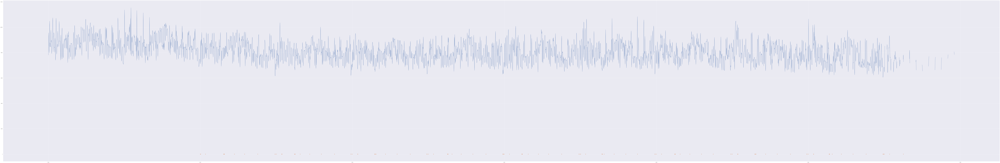

In [56]:

# Plot resampling by day
df_totaldemand_eda_eda_day =df_totaldemand_eda.resample('D').mean()
plt.figure(figsize=(300,50))
plt.plot(df_totaldemand_eda_eda_day['TOTALDEMAND'])
# plt.figure(figsize=(30,5))
plt.plot(df_publicholidays['PUBLICHOLIDAYS'], 'o')


## Forecast Demand

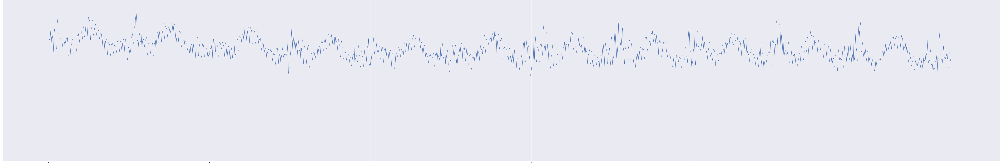

In [57]:

# Plot resampling by day
df_forecast_bushfire =df_forecast_eda.resample('D').mean()
plt.figure(figsize=(300,50))
plt.plot(df_forecast_eda_eda_day['FORECASTDEMAND'])
# plt.figure(figsize=(30,5))
plt.plot(df_publicholidays['PUBLICHOLIDAYS'], 'o')

# Data Cleansing 
Get rid of null - dropna

# EDA Correlation
1. Temp v forcast demand
2. Temp v total demand
3. Temp v total - forcast
4. Time series of total - forcast

## Heatmap

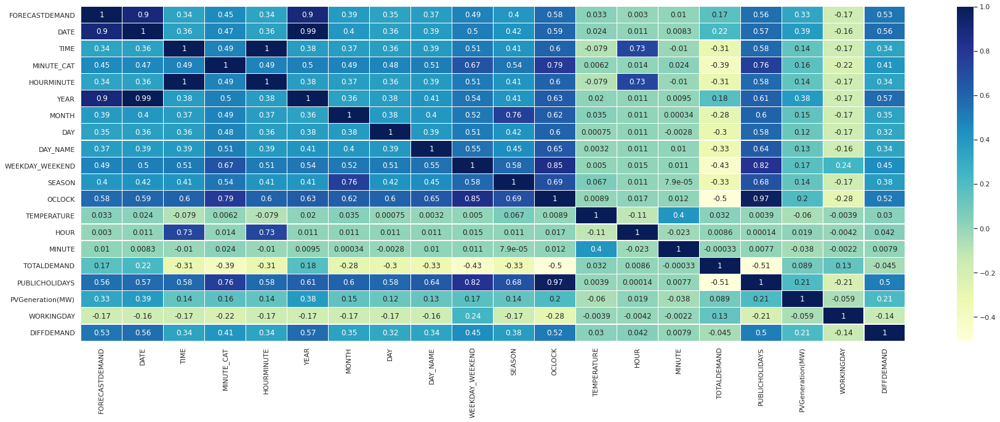

In [58]:

# Correlation betwen features
plt.figure(figsize=(30, 10))
corr = df_final.apply(lambda x: pd.factorize(x)[0]).corr()
ax = sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, linewidths=.2, cmap="YlGnBu", annot=True)

## Temperature


### Temperature vs Total Demand

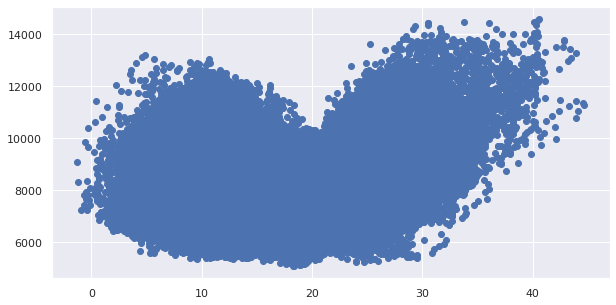

In [59]:

plt.figure(figsize=(10,5))
plt.scatter(df_final['TEMPERATURE'],df_final['TOTALDEMAND'])

### Temperature vs Forecast Demand

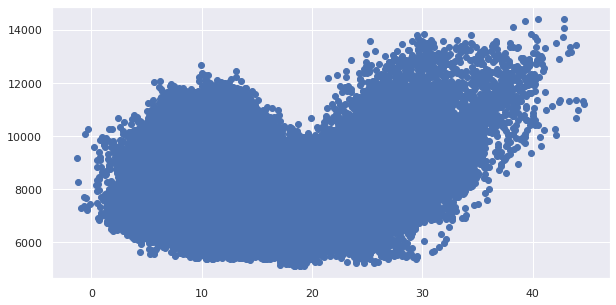

In [60]:

plt.figure(figsize=(10,5))
plt.scatter(df_final['TEMPERATURE'],df_final['FORECASTDEMAND'])

### Temperature vs Total - Forecast


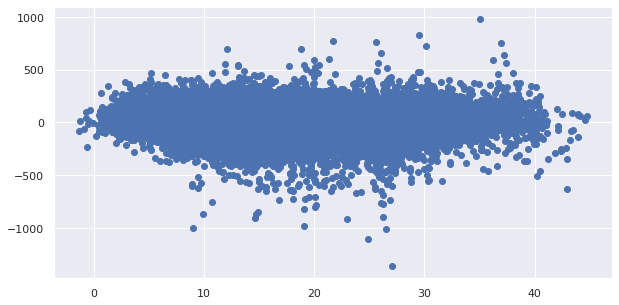

In [61]:

plt.figure(figsize=(10,5))
plt.scatter(df_final['TEMPERATURE'],df_final['TOTALDEMAND']-df_final['FORECASTDEMAND'])
#plt.scatter(df_final['TEMPERATURE'],df_final_eda['DIFFDEMAND'])

## Weekday-Weekend


### Weekday-Weekend vs Total Demand

In [62]:

# plt.figure(figsize=(10,5))
# plt.scatter(df_final['WEEKDAY_WEEKEND'],df_final['TOTALDEMAND'])

### Weekday-Weekend vs Forecast Demand

In [63]:

# plt.figure(figsize=(10,5))
# plt.scatter(df_final['WEEKDAY_WEEKEND'],df_final['FORECASTDEMAND'])

### Weekday-Weekend vs Total - Forecast

In [64]:

# plt.figure(figsize=(10,5))
# plt.scatter(df_final['WEEKDAY_WEEKEND'],df_final['TOTALDEMAND']-df_final['FORECASTDEMAND'])
# #plt.scatter(df_final['TEMPERATURE'],df_final_eda['DIFFDEMAND'])

## Month

### Month vs Total Demand

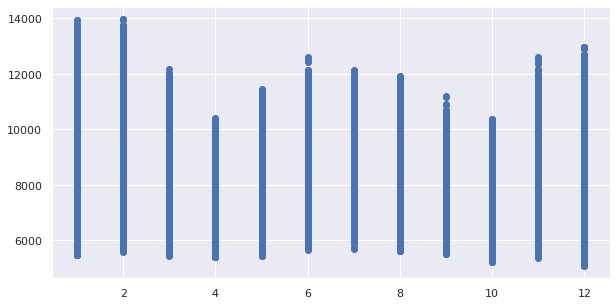

In [65]:

plt.figure(figsize=(10,5))
plt.scatter(df_final['MONTH'],df_final['TOTALDEMAND'])

### Month vs Forecast Demand

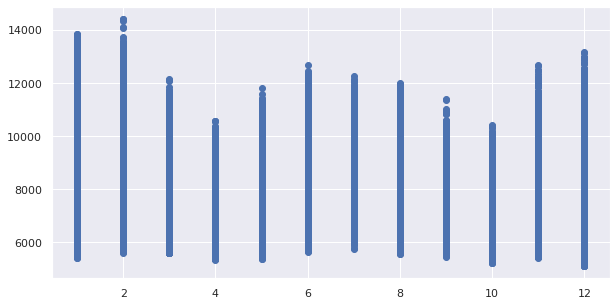

In [66]:

plt.figure(figsize=(10,5))
plt.scatter(df_final['MONTH'],df_final['FORECASTDEMAND'])

### Month vs Total - Forecast

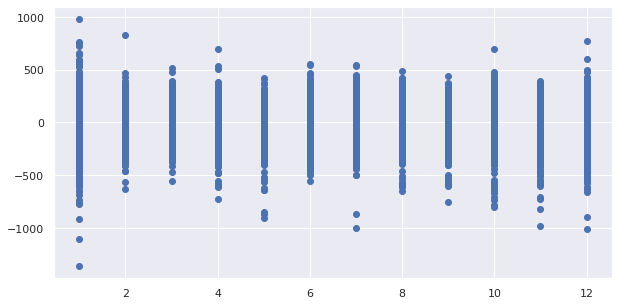

In [67]:

plt.figure(figsize=(10,5))
plt.scatter(df_final['MONTH'],df_final['TOTALDEMAND']-df_final['FORECASTDEMAND'])
#plt.scatter(df_final['TEMPERATURE'],df_final_eda['DIFFDEMAND'])

## Hours

### Hours vs Total Demand

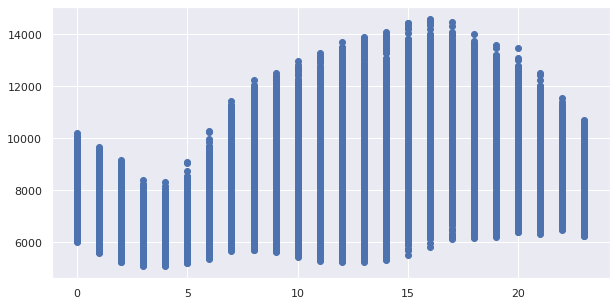

In [68]:

plt.figure(figsize=(10,5))
plt.scatter(df_final['HOUR'],df_final['TOTALDEMAND'])

### Hours vs Forecast Demand

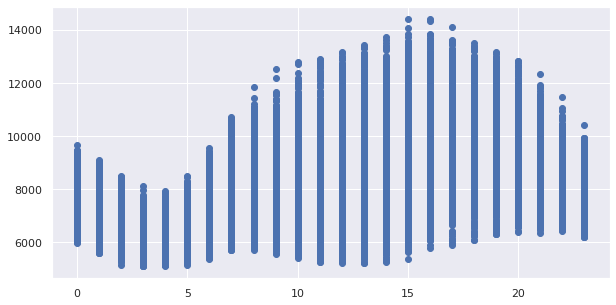

In [69]:

plt.figure(figsize=(10,5))
plt.scatter(df_final['HOUR'],df_final['FORECASTDEMAND'])

### Hours vs Total - Forecast

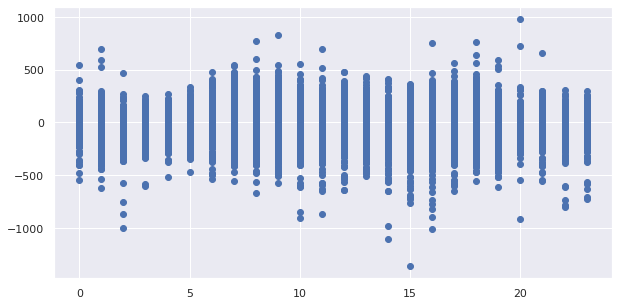

In [70]:

plt.figure(figsize=(10,5))
plt.scatter(df_final['HOUR'],df_final['TOTALDEMAND']-df_final['FORECASTDEMAND'])
#plt.scatter(df_final['TEMPERATURE'],df_final_eda['DIFFDEMAND'])

## Minutes

### Minutes vs Total Demand

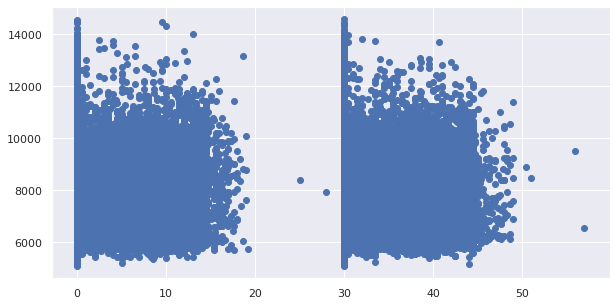

In [71]:

plt.figure(figsize=(10,5))
plt.scatter(df_final['MINUTE'],df_final['TOTALDEMAND'])

### Minutes vs Forecast Demand

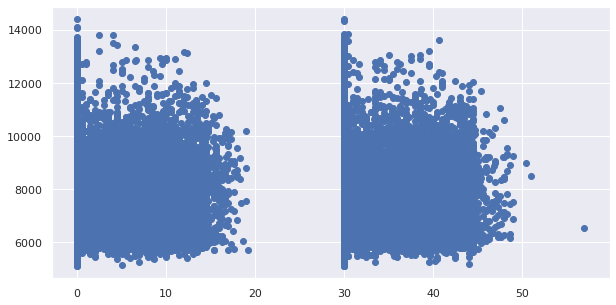

In [72]:

plt.figure(figsize=(10,5))
plt.scatter(df_final['MINUTE'],df_final['FORECASTDEMAND'])

### Minutes vs Total - Forecast Demand

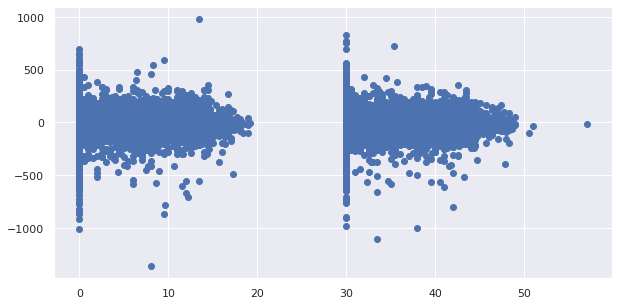

In [73]:

plt.figure(figsize=(10,5))
plt.scatter(df_final['MINUTE'],df_final['TOTALDEMAND']-df_final['FORECASTDEMAND'])
#plt.scatter(df_final['TEMPERATURE'],df_final_eda['DIFFDEMAND'])

## Time Series Diff Demand (Total Demand - Forecast Demand) 
Note:
* Algorithm changed in 2012

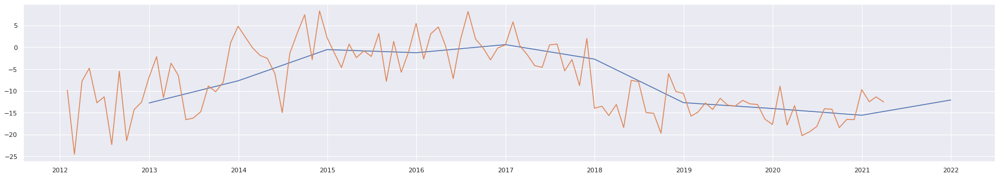

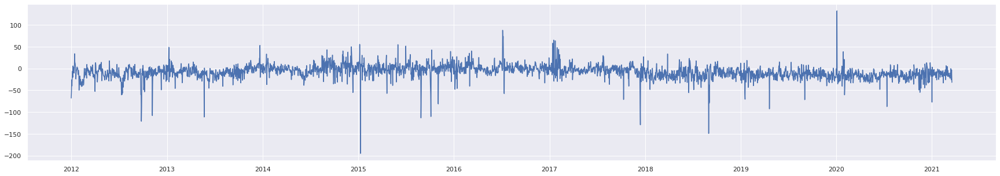

In [74]:

df_final_eda = df_final
df_final_eda_year = df_final_eda.resample('Y').mean()

plt.figure(figsize=(30,5))
plt.plot(df_final_eda_year['DIFFDEMAND'])

df_final_eda_eda_month =df_final_eda.resample('M').mean()
#plt.figure(figsize=(30,10))
plt.plot(df_final_eda_eda_month['DIFFDEMAND'])

# Plot resampling by day
df_final_eda_eda_day =df_final_eda.resample('D').mean()
plt.figure(figsize=(30,5))
plt.plot(df_final_eda_eda_day['DIFFDEMAND'])

## Regression

### Total Demand

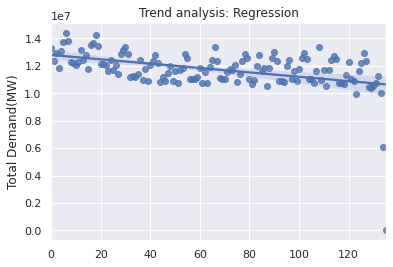

In [75]:

# Resampling per month
df_totaldemand_mon = df_final.TOTALDEMAND.resample("M").agg(sum).to_frame("TOTALDEMAND")
df_totaldemand_mon["ix"] = range(0, len(df_totaldemand_mon))
df_totaldemand_mon[:5]

# Regression plot
sns.regplot(data=df_totaldemand_mon,x="ix", y="TOTALDEMAND")
plt.title("Trend analysis: Regression")
plt.ylabel("Total Demand(MW)")
plt.xlabel("")
plt.show()

### Forecast Demand

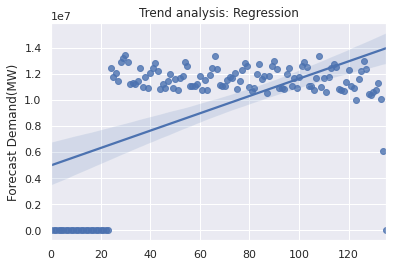

In [76]:

# Resampling per month
df_forecast_mon = df_final.FORECASTDEMAND.resample("M").agg(sum).to_frame("FORECASTDEMAND")
df_forecast_mon["ix"] = range(0, len(df_forecast_mon))
df_forecast_mon[:5]

# Regression plot
sns.regplot(data=df_forecast_mon,x="ix", y="FORECASTDEMAND")
plt.title("Trend analysis: Regression")
plt.ylabel("Forecast Demand(MW)")
plt.xlabel("")
plt.show()

## Boxplot

### Per Year

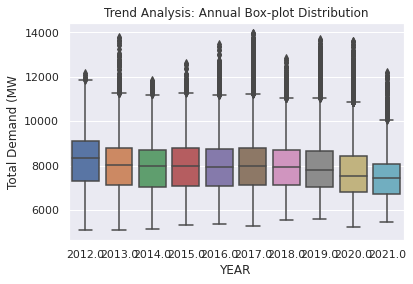

In [77]:

sns.boxplot(data=df_final["2010":"2021"], x="YEAR", y="TOTALDEMAND")
plt.title("Trend Analysis: Annual Box-plot Distribution")
plt.ylabel("Total Demand (MW")
plt.show()

## Pairwise

In [78]:

top5_mostCorrFeats = corr["TOTALDEMAND"].apply(abs).sort_values(ascending=False).index.values[:7]
top5_mostCorrFeats

array(['TOTALDEMAND', 'PUBLICHOLIDAYS', 'OCLOCK', 'WEEKDAY_WEEKEND',
       'MINUTE_CAT', 'SEASON', 'DAY_NAME'], dtype=object)

In [79]:
# # Take a long time so commented out for now.
# sns.pairplot(data=df_final[top5_mostCorrFeats].dropna(), kind="reg")
# plt.title("Most important features Matrix Scatter Plot")
# plt.show()

# Models

## Load the save CSV file into dataframe

In [80]:
# Load the saved CSV file
# df_model = pd.read_csv("/content/data/output.csv")
df_model = pd.read_csv("/content/data/output.csv",header=0,infer_datetime_format=True,parse_dates=['DATETIME'],index_col=['DATETIME'])
df_model

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (2,3,5,9,10,11,12) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,FORECASTDEMAND,DATE,TIME,MINUTE_CAT,HOURMINUTE,YEAR,MONTH,DAY,DAY_NAME,WEEKDAY_WEEKEND,SEASON,OCLOCK,TEMPERATURE,HOUR,MINUTE,TOTALDEMAND,PUBLICHOLIDAYS,PVGeneration(MW),WORKINGDAY,DIFFDEMAND
DATETIME,,,,,,,,,,,,,,,,,,,,
2012-01-01 00:00:00,7073.47,2012-01-01,00:00:00,0.0,0-0,2012.0,1.0,1.0,Sunday,weekend,summer,oclock,15.4,0.0,0.0,7079.08,1.0,0.0,non_working,5.61
2012-01-01 00:30:00,6938.19,2012-01-01,00:30:00,30.0,0-30,2012.0,1.0,1.0,Sunday,weekend,summer,oclock,14.7,0.0,30.0,6976.86,1.0,0.0,non_working,38.67
2012-01-01 01:00:00,6820.57,2012-01-01,01:00:00,0.0,1-0,2012.0,1.0,1.0,Sunday,weekend,summer,oclock,14.9,1.0,0.0,6796.47,1.0,0.0,non_working,-24.10
2012-01-01 01:30:00,6564.27,2012-01-01,01:30:00,30.0,1-30,2012.0,1.0,1.0,Sunday,weekend,summer,oclock,14.2,1.0,30.0,6494.43,1.0,0.0,non_working,-69.84
2012-01-01 02:00:00,6337.37,2012-01-01,02:00:00,0.0,2-0,2012.0,1.0,1.0,Sunday,weekend,summer,oclock,13.9,2.0,0.0,6271.40,1.0,0.0,non_working,-65.97
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-04-01 22:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,working,NaN
2021-04-01 22:30:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,working,NaN
2021-04-01 23:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,working,NaN


### Pre-Processing
* Drop unused columns
* One-hot Encoding
* Drop Na


In [81]:

# Drop unused columns
df_final_noonehot = df_model.drop(["DIFFDEMAND", "DATE", "TIME"] , axis= 1) # Drop FORECASTDEMAND???

# Drop na
df_final_noonehot.dropna(inplace=True)

# Apply one-hot encoding get dummies for multiple classes
# df = pd.get_dummies(data = df,columns = multiple_columns) 
# df_final_onehot = pd.get_dummies(data = df_final_onehot.loc['2020']) ### LIMIT DATA TO ONLY YEAR 2021
df_final_onehot = pd.get_dummies(data = df_final_noonehot) 


# Drop below columns after feature selection using regression
# Drop unused columns
## df_final_onehot.drop(['MONTH','DAY','MINUTE','PUBLICHOLIDAYS','HOURMINUTE_10-30','HOURMINUTE_16-30','HOURMINUTE_19-0'
##                       ,'HOURMINUTE_17-30','HOURMINUTE_13-30','HOURMINUTE_15-30','HOURMINUTE_11-30','HOURMINUTE_12-30'
##                       ], axis = 1, inplace=True) 

df_final_onehot

,FORECASTDEMAND,MINUTE_CAT,YEAR,MONTH,DAY,TEMPERATURE,HOUR,MINUTE,TOTALDEMAND,PUBLICHOLIDAYS,PVGeneration(MW),HOURMINUTE_0-0,HOURMINUTE_0-30,HOURMINUTE_1-0,HOURMINUTE_1-30,HOURMINUTE_10-0,HOURMINUTE_10-30,HOURMINUTE_11-0,HOURMINUTE_11-30,HOURMINUTE_12-0,HOURMINUTE_12-30,HOURMINUTE_13-0,HOURMINUTE_13-30,HOURMINUTE_14-0,HOURMINUTE_14-30,HOURMINUTE_15-0,HOURMINUTE_15-30,HOURMINUTE_16-0,HOURMINUTE_16-30,HOURMINUTE_17-0,HOURMINUTE_17-30,HOURMINUTE_18-0,HOURMINUTE_18-30,HOURMINUTE_19-0,HOURMINUTE_19-30,HOURMINUTE_2-0,HOURMINUTE_2-30,HOURMINUTE_20-0,HOURMINUTE_20-30,HOURMINUTE_21-0,HOURMINUTE_21-30,HOURMINUTE_22-0,HOURMINUTE_22-30,HOURMINUTE_23-0,HOURMINUTE_23-30,HOURMINUTE_3-0,HOURMINUTE_3-30,HOURMINUTE_4-0,HOURMINUTE_4-30,HOURMINUTE_5-0,HOURMINUTE_5-30,HOURMINUTE_6-0,HOURMINUTE_6-30,HOURMINUTE_7-0,HOURMINUTE_7-30,HOURMINUTE_8-0,HOURMINUTE_8-30,HOURMINUTE_9-0,HOURMINUTE_9-30,DAY_NAME_Friday,DAY_NAME_Monday,DAY_NAME_Saturday,DAY_NAME_Sunday,DAY_NAME_Thursday,DAY_NAME_Tuesday,DAY_NAME_Wednesday,WEEKDAY_WEEKEND_weekday,WEEKDAY_WEEKEND_weekend,SEASON_autumn,SEASON_spring,SEASON_summer,SEASON_winter,OCLOCK_oclock,WORKINGDAY_non_working,WORKINGDAY_working
DATETIME,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012-01-01 00:00:00,7073.47,0.0,2012.0,1.0,1.0,15.40,0.0,0.0,7079.08,1.0,0.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,1,1,0
2012-01-01 00:30:00,6938.19,30.0,2012.0,1.0,1.0,14.70,0.0,30.0,6976.86,1.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,1,1,0
2012-01-01 01:00:00,6820.57,0.0,2012.0,1.0,1.0,14.90,1.0,0.0,6796.47,1.0,0.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,1,1,0
2012-01-01 01:30:00,6564.27,30.0,2012.0,1.0,1.0,14.20,1.0,30.0,6494.43,1.0,0.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,1,1,0
2012-01-01 02:00:00,6337.37,0.0,2012.0,1.0,1.0,13.90,2.0,0.0,6271.40,1.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-17 22:00:00,7409.33,0.0,2021.0,3.0,17.0,19.70,22.0,0.0,7419.77,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,1,0,1
2021-03-17 22:30:00,7422.63,30.0,2021.0,3.0,17.0,19.50,22.0,30.0,7417.91,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,1,0,1
2021-03-17 23:00:00,7313.13,0.0,2021.0,3.0,17.0,19.05,23.0,10.0,7287.32,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,1,0,1


### Drop columns before VIF
Drop DAY, SEASON, WEEKDAY_WEEKEND, WORKINGDAY
https://stackoverflow.com/questions/41136853/whats-the-difference-between-dummy-variable-and-one-hot-encoding

In [82]:
# Drop columns before VIF - Drop DAY, SEASON, WEEKDAY_WEEKEND, WORKINGDAY
df_final_onehot.drop(['HOURMINUTE_9-30','DAY_NAME_Wednesday','WEEKDAY_WEEKEND_weekend','SEASON_winter','WORKINGDAY_working'
                      ], axis = 1, inplace=True)

In [83]:
# X contains all the features that are used for making the predictions.
# Y contains outcomes 
X = df_final_onehot.drop(["TOTALDEMAND"] , axis= 1)
y = df_final_onehot['TOTALDEMAND']

# y = df_final_onehot[['YEAR','TOTALDEMAND']] # Add year for filter train and test data

# X = df_final_noonehot.drop(["TOTALDEMAND"] , axis= 1)
# y = df_final_noonehot['TOTALDEMAND']

df_final_onehot
# df_final_noonehot

,FORECASTDEMAND,MINUTE_CAT,YEAR,MONTH,DAY,TEMPERATURE,HOUR,MINUTE,TOTALDEMAND,PUBLICHOLIDAYS,PVGeneration(MW),HOURMINUTE_0-0,HOURMINUTE_0-30,HOURMINUTE_1-0,HOURMINUTE_1-30,HOURMINUTE_10-0,HOURMINUTE_10-30,HOURMINUTE_11-0,HOURMINUTE_11-30,HOURMINUTE_12-0,HOURMINUTE_12-30,HOURMINUTE_13-0,HOURMINUTE_13-30,HOURMINUTE_14-0,HOURMINUTE_14-30,HOURMINUTE_15-0,HOURMINUTE_15-30,HOURMINUTE_16-0,HOURMINUTE_16-30,HOURMINUTE_17-0,HOURMINUTE_17-30,HOURMINUTE_18-0,HOURMINUTE_18-30,HOURMINUTE_19-0,HOURMINUTE_19-30,HOURMINUTE_2-0,HOURMINUTE_2-30,HOURMINUTE_20-0,HOURMINUTE_20-30,HOURMINUTE_21-0,HOURMINUTE_21-30,HOURMINUTE_22-0,HOURMINUTE_22-30,HOURMINUTE_23-0,HOURMINUTE_23-30,HOURMINUTE_3-0,HOURMINUTE_3-30,HOURMINUTE_4-0,HOURMINUTE_4-30,HOURMINUTE_5-0,HOURMINUTE_5-30,HOURMINUTE_6-0,HOURMINUTE_6-30,HOURMINUTE_7-0,HOURMINUTE_7-30,HOURMINUTE_8-0,HOURMINUTE_8-30,HOURMINUTE_9-0,DAY_NAME_Friday,DAY_NAME_Monday,DAY_NAME_Saturday,DAY_NAME_Sunday,DAY_NAME_Thursday,DAY_NAME_Tuesday,WEEKDAY_WEEKEND_weekday,SEASON_autumn,SEASON_spring,SEASON_summer,OCLOCK_oclock,WORKINGDAY_non_working
DATETIME,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012-01-01 00:00:00,7073.47,0.0,2012.0,1.0,1.0,15.40,0.0,0.0,7079.08,1.0,0.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,1
2012-01-01 00:30:00,6938.19,30.0,2012.0,1.0,1.0,14.70,0.0,30.0,6976.86,1.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,1
2012-01-01 01:00:00,6820.57,0.0,2012.0,1.0,1.0,14.90,1.0,0.0,6796.47,1.0,0.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,1
2012-01-01 01:30:00,6564.27,30.0,2012.0,1.0,1.0,14.20,1.0,30.0,6494.43,1.0,0.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,1
2012-01-01 02:00:00,6337.37,0.0,2012.0,1.0,1.0,13.90,2.0,0.0,6271.40,1.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-17 22:00:00,7409.33,0.0,2021.0,3.0,17.0,19.70,22.0,0.0,7419.77,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0
2021-03-17 22:30:00,7422.63,30.0,2021.0,3.0,17.0,19.50,22.0,30.0,7417.91,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0
2021-03-17 23:00:00,7313.13,0.0,2021.0,3.0,17.0,19.05,23.0,10.0,7287.32,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0


### VIF - Variance Inflation Factor
* Calculate VIF for individual variable
* Drop column if value is too large
* R: LM => VIF => Re-do
* Drop last one-hot columns (last...30min time, season, workday, day, weekend) & VIF & drop columns before regression

https://etav.github.io/python/vif_factor_python.html#:~:text=The%20Variance%20Inflation%20Factor%20


In [84]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# For each X, calculate VIF and save in dataframe
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["features"] = X.columns

vif

/usr/local/lib/python3.7/dist-packages/statsmodels/stats/outliers_influence.py:185: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)
/usr/local/lib/python3.7/dist-packages/statsmodels/regression/linear_model.py:1636: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss


,VIF Factor,features
0,3.188762,FORECASTDEMAND
1,inf,MINUTE_CAT
2,1.242765,YEAR
3,1.850212,MONTH
4,1.002355,DAY
...,...,...
64,2.671431,SEASON_autumn
65,2.744277,SEASON_spring
66,3.528164,SEASON_summer
67,0.000000,OCLOCK_oclock


In [85]:
# vif.round(1)

# Filter to use only data from year 2012 onwards
vif_out = vif.loc[(vif['VIF Factor'] >= 100)]
vif_out

,VIF Factor,features
1,inf,MINUTE_CAT
6,inf,HOUR
10,inf,HOURMINUTE_0-0
11,inf,HOURMINUTE_0-30
12,inf,HOURMINUTE_1-0
13,inf,HOURMINUTE_1-30
14,inf,HOURMINUTE_10-0
15,inf,HOURMINUTE_10-30
16,inf,HOURMINUTE_11-0
17,inf,HOURMINUTE_11-30


In [86]:
X.columns

Index(['FORECASTDEMAND', 'MINUTE_CAT', 'YEAR', 'MONTH', 'DAY', 'TEMPERATURE',
       'HOUR', 'MINUTE', 'PUBLICHOLIDAYS', 'PVGeneration(MW)',
       'HOURMINUTE_0-0', 'HOURMINUTE_0-30', 'HOURMINUTE_1-0',
       'HOURMINUTE_1-30', 'HOURMINUTE_10-0', 'HOURMINUTE_10-30',
       'HOURMINUTE_11-0', 'HOURMINUTE_11-30', 'HOURMINUTE_12-0',
       'HOURMINUTE_12-30', 'HOURMINUTE_13-0', 'HOURMINUTE_13-30',
       'HOURMINUTE_14-0', 'HOURMINUTE_14-30', 'HOURMINUTE_15-0',
       'HOURMINUTE_15-30', 'HOURMINUTE_16-0', 'HOURMINUTE_16-30',
       'HOURMINUTE_17-0', 'HOURMINUTE_17-30', 'HOURMINUTE_18-0',
       'HOURMINUTE_18-30', 'HOURMINUTE_19-0', 'HOURMINUTE_19-30',
       'HOURMINUTE_2-0', 'HOURMINUTE_2-30', 'HOURMINUTE_20-0',
       'HOURMINUTE_20-30', 'HOURMINUTE_21-0', 'HOURMINUTE_21-30',
       'HOURMINUTE_22-0', 'HOURMINUTE_22-30', 'HOURMINUTE_23-0',
       'HOURMINUTE_23-30', 'HOURMINUTE_3-0', 'HOURMINUTE_3-30',
       'HOURMINUTE_4-0', 'HOURMINUTE_4-30', 'HOURMINUTE_5-0',
       'HOURMINUTE_

### Drop columns after VIF


In [87]:
# Drop columns before VIF - Drop DAY, SEASON, WEEKDAY_WEEKEND, WORKINGDAY
X.drop(['MINUTE_CAT','SEASON_summer','WORKINGDAY_non_working','WEEKDAY_WEEKEND_weekday','OCLOCK_oclock',
'HOUR',
'HOURMINUTE_0-0',
'HOURMINUTE_0-30',
'HOURMINUTE_1-0',
'HOURMINUTE_1-30',
'HOURMINUTE_10-0',
'HOURMINUTE_10-30',
'HOURMINUTE_11-0',
'HOURMINUTE_11-30',
'HOURMINUTE_12-0',
'HOURMINUTE_12-30',
'HOURMINUTE_13-0',
'HOURMINUTE_13-30',
'HOURMINUTE_14-0',
'HOURMINUTE_14-30',
'HOURMINUTE_15-0',
'HOURMINUTE_15-30',
'HOURMINUTE_16-0',
'HOURMINUTE_16-30',
'HOURMINUTE_17-0',
'HOURMINUTE_17-30',
'HOURMINUTE_18-0',
'HOURMINUTE_18-30',
'HOURMINUTE_19-0',
'HOURMINUTE_19-30',
'HOURMINUTE_2-0',
'HOURMINUTE_2-30',
'HOURMINUTE_20-0',
'HOURMINUTE_20-30',
'HOURMINUTE_21-0',
'HOURMINUTE_21-30',
'HOURMINUTE_22-0',
'HOURMINUTE_22-30',
'HOURMINUTE_23-0',
'HOURMINUTE_23-30',
'HOURMINUTE_3-0',
'HOURMINUTE_3-30',
'HOURMINUTE_4-0',
'HOURMINUTE_4-30',
'HOURMINUTE_5-0',
'HOURMINUTE_5-30',
'HOURMINUTE_6-0',
'HOURMINUTE_6-30',
'HOURMINUTE_7-0',
'HOURMINUTE_7-30',
'HOURMINUTE_8-0',
'HOURMINUTE_8-30'], axis = 1, inplace=True)

In [88]:
X

,FORECASTDEMAND,YEAR,MONTH,DAY,TEMPERATURE,MINUTE,PUBLICHOLIDAYS,PVGeneration(MW),HOURMINUTE_9-0,DAY_NAME_Friday,DAY_NAME_Monday,DAY_NAME_Saturday,DAY_NAME_Sunday,DAY_NAME_Thursday,DAY_NAME_Tuesday,SEASON_autumn,SEASON_spring
DATETIME,,,,,,,,,,,,,,,,,
2012-01-01 00:00:00,7073.47,2012.0,1.0,1.0,15.40,0.0,1.0,0.0,0,0,0,0,1,0,0,0,0
2012-01-01 00:30:00,6938.19,2012.0,1.0,1.0,14.70,30.0,1.0,0.0,0,0,0,0,1,0,0,0,0
2012-01-01 01:00:00,6820.57,2012.0,1.0,1.0,14.90,0.0,1.0,0.0,0,0,0,0,1,0,0,0,0
2012-01-01 01:30:00,6564.27,2012.0,1.0,1.0,14.20,30.0,1.0,0.0,0,0,0,0,1,0,0,0,0
2012-01-01 02:00:00,6337.37,2012.0,1.0,1.0,13.90,0.0,1.0,0.0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-17 22:00:00,7409.33,2021.0,3.0,17.0,19.70,0.0,0.0,0.0,0,0,0,0,0,0,0,1,0
2021-03-17 22:30:00,7422.63,2021.0,3.0,17.0,19.50,30.0,0.0,0.0,0,0,0,0,0,0,0,1,0
2021-03-17 23:00:00,7313.13,2021.0,3.0,17.0,19.05,10.0,0.0,0.0,0,0,0,0,0,0,0,1,0


## Split data

In [89]:
 X

,FORECASTDEMAND,YEAR,MONTH,DAY,TEMPERATURE,MINUTE,PUBLICHOLIDAYS,PVGeneration(MW),HOURMINUTE_9-0,DAY_NAME_Friday,DAY_NAME_Monday,DAY_NAME_Saturday,DAY_NAME_Sunday,DAY_NAME_Thursday,DAY_NAME_Tuesday,SEASON_autumn,SEASON_spring
DATETIME,,,,,,,,,,,,,,,,,
2012-01-01 00:00:00,7073.47,2012.0,1.0,1.0,15.40,0.0,1.0,0.0,0,0,0,0,1,0,0,0,0
2012-01-01 00:30:00,6938.19,2012.0,1.0,1.0,14.70,30.0,1.0,0.0,0,0,0,0,1,0,0,0,0
2012-01-01 01:00:00,6820.57,2012.0,1.0,1.0,14.90,0.0,1.0,0.0,0,0,0,0,1,0,0,0,0
2012-01-01 01:30:00,6564.27,2012.0,1.0,1.0,14.20,30.0,1.0,0.0,0,0,0,0,1,0,0,0,0
2012-01-01 02:00:00,6337.37,2012.0,1.0,1.0,13.90,0.0,1.0,0.0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-17 22:00:00,7409.33,2021.0,3.0,17.0,19.70,0.0,0.0,0.0,0,0,0,0,0,0,0,1,0
2021-03-17 22:30:00,7422.63,2021.0,3.0,17.0,19.50,30.0,0.0,0.0,0,0,0,0,0,0,0,1,0
2021-03-17 23:00:00,7313.13,2021.0,3.0,17.0,19.05,10.0,0.0,0.0,0,0,0,0,0,0,0,1,0


In [90]:
y

DATETIME
2012-01-01 00:00:00    7079.08
2012-01-01 00:30:00    6976.86
2012-01-01 01:00:00    6796.47
2012-01-01 01:30:00    6494.43
2012-01-01 02:00:00    6271.40
                        ...   
2021-03-17 22:00:00    7419.77
2021-03-17 22:30:00    7417.91
2021-03-17 23:00:00    7287.32
2021-03-17 23:30:00    7172.39
2021-03-18 00:00:00    7094.51
Name: TOTALDEMAND, Length: 161185, dtype: float64

In [91]:
# Split train and test data
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 25)

# Split train and test data - use year 2020 data for Test
X_train =  X.loc[(X['YEAR'] != 2020)]
X_test =  X.loc[(X['YEAR'] == 2020)]

y_train = df_final_onehot['TOTALDEMAND'].loc[(df_final_onehot['YEAR'] != 2020)]
y_test = df_final_onehot['TOTALDEMAND'].loc[(df_final_onehot['YEAR'] == 2020)]

y_test

DATETIME
2020-01-01 00:00:00    7318.64
2020-01-01 00:30:00    7134.15
2020-01-01 01:00:00    6886.14
2020-01-01 01:30:00    6682.01
2020-01-01 02:00:00    6452.46
                        ...   
2020-12-31 21:30:00    7072.75
2020-12-31 22:00:00    7062.97
2020-12-31 22:30:00    7172.60
2020-12-31 23:00:00    7125.65
2020-12-31 23:30:00    7080.04
Name: TOTALDEMAND, Length: 17566, dtype: float64

### Final Drop Columns X_train X_test

In [92]:
# Drop columns 
X_train.drop(['YEAR'], axis = 1, inplace=True)
X_test.drop(['YEAR'], axis = 1, inplace=True)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [93]:
# # Drop columns 
# X_train.drop(['FORECASTDEMAND'], axis = 1, inplace=True)
# X_test.drop(['FORECASTDEMAND'], axis = 1, inplace=True)

In [94]:
# # Drop columns 
# X_train.drop(['TEMPERATURE'], axis = 1, inplace=True)
# X_test.drop(['TEMPERATURE'], axis = 1, inplace=True)

In [95]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# For each X, calculate VIF and save in dataframe
vif_train = pd.DataFrame()
vif_train["VIF Factor"] = [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])]
vif_train["features"] = X_train.columns

vif_train

,VIF Factor,features
0,19.844972,FORECASTDEMAND
1,6.809203,MONTH
2,4.036350,DAY
3,11.773908,TEMPERATURE
4,2.085746,MINUTE
5,1.070706,PUBLICHOLIDAYS
6,1.455246,PVGeneration(MW)
7,1.053483,HOURMINUTE_9-0
8,1.911118,DAY_NAME_Friday
9,1.927802,DAY_NAME_Monday


In [96]:
X_train
X_test

,FORECASTDEMAND,MONTH,DAY,TEMPERATURE,MINUTE,PUBLICHOLIDAYS,PVGeneration(MW),HOURMINUTE_9-0,DAY_NAME_Friday,DAY_NAME_Monday,DAY_NAME_Saturday,DAY_NAME_Sunday,DAY_NAME_Thursday,DAY_NAME_Tuesday,SEASON_autumn,SEASON_spring
DATETIME,,,,,,,,,,,,,,,,
2020-01-01 00:00:00,7384.53,1.0,1.0,19.4,0.0,1.0,0.0,0,0,0,0,0,0,0,0,0
2020-01-01 00:30:00,7178.22,1.0,1.0,19.3,30.0,1.0,0.0,0,0,0,0,0,0,0,0,0
2020-01-01 01:00:00,6905.29,1.0,1.0,19.4,0.0,1.0,0.0,0,0,0,0,0,0,0,0,0
2020-01-01 01:30:00,6635.64,1.0,1.0,19.5,30.0,1.0,0.0,0,0,0,0,0,0,0,0,0
2020-01-01 02:00:00,6442.23,1.0,1.0,19.1,0.0,1.0,0.0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31 21:30:00,7179.57,12.0,31.0,20.1,30.0,0.0,0.0,0,0,0,0,0,1,0,0,0
2020-12-31 22:00:00,7155.88,12.0,31.0,19.9,0.0,0.0,0.0,0,0,0,0,0,1,0,0,0
2020-12-31 22:30:00,7206.15,12.0,31.0,19.6,30.0,0.0,0.0,0,0,0,0,0,1,0,0,0


In [97]:
# y_train
y_test

DATETIME
2020-01-01 00:00:00    7318.64
2020-01-01 00:30:00    7134.15
2020-01-01 01:00:00    6886.14
2020-01-01 01:30:00    6682.01
2020-01-01 02:00:00    6452.46
                        ...   
2020-12-31 21:30:00    7072.75
2020-12-31 22:00:00    7062.97
2020-12-31 22:30:00    7172.60
2020-12-31 23:00:00    7125.65
2020-12-31 23:30:00    7080.04
Name: TOTALDEMAND, Length: 17566, dtype: float64

In [98]:

# # Number of observations
nobs= len(df_final_onehot)
print("Number of observations: ", nobs)

# X_train = df_final.loc['2010':'2021'][top5_mostCorrFeats]
# #X_train = df_final[top5_mostCorrFeats]
# y_train = df_final.loc["2010":"2021"]['TOTALDEMAND']
# #y_train = df_final['TOTALDEMAND']

# X_test = df_final.loc["2018"][top5_mostCorrFeats]
# y_test = df_final.loc["2018"]['TOTALDEMAND']

n, k = X_train.shape
print("Total number of observations: ", nobs)
print("Train: {}{}, \nTest: {}{}".format(X_train.shape, y_train.shape,
                                              X_test.shape, y_test.shape))

# plt.plot(y_train.index, y_train.TOTALDEMAND.values, label="train")
# plt.plot(y_test.index, y_test.TOTALDEMAND.values, label="test")
# plt.title("Train/Test split")
# plt.xticks(rotation=45)
# plt.show()

Number of observations:  161185
Total number of observations:  161185
Train: (143619, 16)(143619,), 
Test: (17566, 16)(17566,)


## Feature Selection
* Use Regression to see significances (for regression)
* User Random Forest to see weights (for classification, not regression)

In [99]:
import pandas as pd
import numpy as np
from sklearn import datasets, linear_model
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from scipy import stats

X2 = sm.add_constant(X)
est = sm.OLS(y, X2)
est2 = est.fit()
print(est2.summary())

                            OLS Regression Results                            
Dep. Variable:            TOTALDEMAND   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                 2.438e+06
Date:                Mon, 31 May 2021   Prob (F-statistic):               0.00
Time:                        01:18:59   Log-Likelihood:            -9.2925e+05
No. Observations:              161185   AIC:                         1.859e+06
Df Residuals:                  161167   BIC:                         1.859e+06
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const              1744.4007    156.51

## Export CSV for X y

In [100]:
# Export dataframt to CSV for model
X_train.to_csv("/content/data/xtrain.csv")
X_test.to_csv("/content/data/xtest.csv")
y_train.to_csv("/content/data/ytrain.csv")
y_train.to_csv("/content/data/ytest.csv")

# # To read
# df_model = pd.read_csv("/content/data/output.csv")
# df_model

In [101]:
X_train.columns

Index(['FORECASTDEMAND', 'MONTH', 'DAY', 'TEMPERATURE', 'MINUTE',
       'PUBLICHOLIDAYS', 'PVGeneration(MW)', 'HOURMINUTE_9-0',
       'DAY_NAME_Friday', 'DAY_NAME_Monday', 'DAY_NAME_Saturday',
       'DAY_NAME_Sunday', 'DAY_NAME_Thursday', 'DAY_NAME_Tuesday',
       'SEASON_autumn', 'SEASON_spring'],
      dtype='object')

## Model
See experiments in Google Drive
https://docs.google.com/spreadsheets/d/1jlGG8LbfcLQqmZCmj8_bcaE1bNGVWKzMauO-W7D2-i0/edit?usp=sharing

### MLPRegressor

In [102]:
import sklearn
import numpy as np
from sklearn.neural_network import MLPRegressor 

def rmse(pred, actual): 
	return np.sqrt(((pred-actual)**2).mean())

# Neural Network Model
mlp_adam = MLPRegressor(hidden_layer_sizes=(200, ), activation='relu', solver='adam', alpha=0.001,max_iter=5000, tol=0)
mlp_adam.fit(X_train,y_train)
y_predicttrain = mlp_adam.predict(X_train)
y_predicttest = mlp_adam.predict(X_test)
train_rmse = rmse( y_predicttrain, y_train) 
test_rmse = rmse( y_predicttest, y_test) 

# print(train_acc, test_acc) 
print('Train RMSE: {}\nTest RMSE: {}'.format(train_rmse, test_rmse))

Train RMSE: 77.78664151130707
Test RMSE: 72.109004448059


### Plot output

#### Y Train vs Y Train Predict

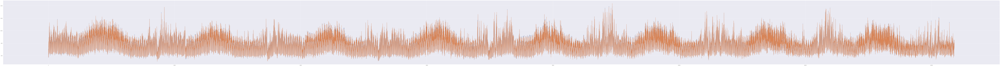

In [103]:
# Convert numpy to dataframe
df_y_predicttrain = pd.DataFrame(y_predicttrain, columns = ['TOTALDEMAND'])
df_y_predicttrain.insert(0, 'New_ID', range(0, 0 + len(df_y_predicttrain)))

# Convert to dataframe and insert new ID for join
df_y_train = pd.DataFrame(y_train, columns = ['TOTALDEMAND'])
df_y_train.insert(0, 'New_ID', range(0, 0 + len(df_y_train)))
# df_y_train

# Join train and predict output dataframes
df_y_train_plot = pd.merge(df_y_train, df_y_predicttrain, how='left', left_on='New_ID', right_on='New_ID')

# Plot Output
plt.figure(figsize=(300,20))
plt.plot(df_y_train_plot['TOTALDEMAND_x'])
plt.plot(df_y_train_plot['TOTALDEMAND_y']) # Y Predict Train

#### Y Train Y Test

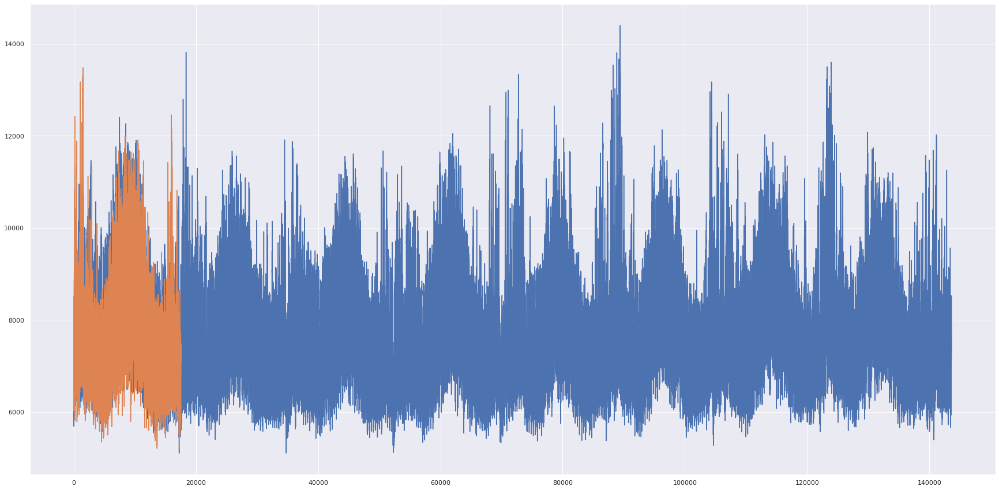

In [104]:
# Plot Output
plt.figure(figsize=(30,15))
plt.plot(y_predicttrain)
plt.plot(y_predicttest)
plt.show()

#### Y Test vs Y Test Predict

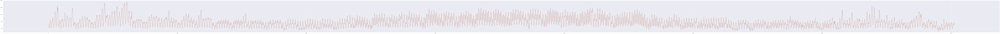

In [105]:
# Convert numpy to dataframe
df_y_predicttest = pd.DataFrame(y_predicttest, columns = ['TOTALDEMAND'])
df_y_predicttest.insert(0, 'New_ID', range(0, 0 + len(df_y_predicttest)))

# Convert to dataframe and insert new ID for join
df_y_test = pd.DataFrame(y_test, columns = ['TOTALDEMAND'])
df_y_test.insert(0, 'New_ID', range(0, 0 + len(df_y_test)))
# df_y_test

# Join test and predict output dataframes
df_y_test_plot = pd.merge(df_y_test, df_y_predicttest, how='left', left_on='New_ID', right_on='New_ID')

# Plot Output
plt.figure(figsize=(300,10))
plt.plot(df_y_test_plot['TOTALDEMAND_x'])
plt.plot(df_y_test_plot['TOTALDEMAND_y']) # Y Predict test

In [106]:
# y_train
# y_test
# y_predicttrain
y_predicttest

array([7360.58459263, 7155.97767996, 6882.83246465, ..., 7196.89777394,
       7192.62533706, 7094.07982313])

In [107]:
y_predicttrain

array([7051.57261063, 6917.76041662, 6799.40136497, ..., 7296.63835886,
       7176.61413292, 7111.73396846])

In [108]:
df_y_train

,New_ID,TOTALDEMAND
DATETIME,,
2012-01-01 00:00:00,0,7079.08
2012-01-01 00:30:00,1,6976.86
2012-01-01 01:00:00,2,6796.47
2012-01-01 01:30:00,3,6494.43
2012-01-01 02:00:00,4,6271.40
...,...,...
2021-03-17 22:00:00,143614,7419.77
2021-03-17 22:30:00,143615,7417.91
2021-03-17 23:00:00,143616,7287.32


In [109]:
df_y_train

,New_ID,TOTALDEMAND
DATETIME,,
2012-01-01 00:00:00,0,7079.08
2012-01-01 00:30:00,1,6976.86
2012-01-01 01:00:00,2,6796.47
2012-01-01 01:30:00,3,6494.43
2012-01-01 02:00:00,4,6271.40
...,...,...
2021-03-17 22:00:00,143614,7419.77
2021-03-17 22:30:00,143615,7417.91
2021-03-17 23:00:00,143616,7287.32


In [110]:
# WIP: Need to plot y_train vs y_predicttrain, y_test vs y_predicttest
# Convert from numpy array to panda dataframd
df_y_train = pd.DataFrame(y_train, columns = ['TOTALDEMAND'])
# df_y_train = df_y_train.resample('M').mean()

# df_y_train

# merge df_y_train and df_y_predicttrain the plot???
# df_y_predicttrain = pd.DataFrame(y_predicttrain, columns = ['TOTALDEMAND'])

y_predicttrain

# df_y_test = pd.DataFrame(y_test, columns = ['TOTALDEMAND'])
# df_y_test = df_y_test.resample('M').mean()

# Plot Output
# plt.figure(figsize=(30,10))
# plt.plot(df_y_train['TOTALDEMAND'])
# plt.plot(df_y_predicttrain['TOTALDEMAND'])

array([7051.57261063, 6917.76041662, 6799.40136497, ..., 7296.63835886,
       7176.61413292, 7111.73396846])

In [111]:

# # Plot RMSE
# pyplot.plot(test)
# pyplot.plot(predictions)
# pyplot.show()

### LSTM

In [112]:
# df_final_noonehot
y

DATETIME
2012-01-01 00:00:00    7079.08
2012-01-01 00:30:00    6976.86
2012-01-01 01:00:00    6796.47
2012-01-01 01:30:00    6494.43
2012-01-01 02:00:00    6271.40
                        ...   
2021-03-17 22:00:00    7419.77
2021-03-17 22:30:00    7417.91
2021-03-17 23:00:00    7287.32
2021-03-17 23:30:00    7172.39
2021-03-18 00:00:00    7094.51
Name: TOTALDEMAND, Length: 161185, dtype: float64

630/630 [==============================] - 29s 43ms/step - loss: 12273307.8288


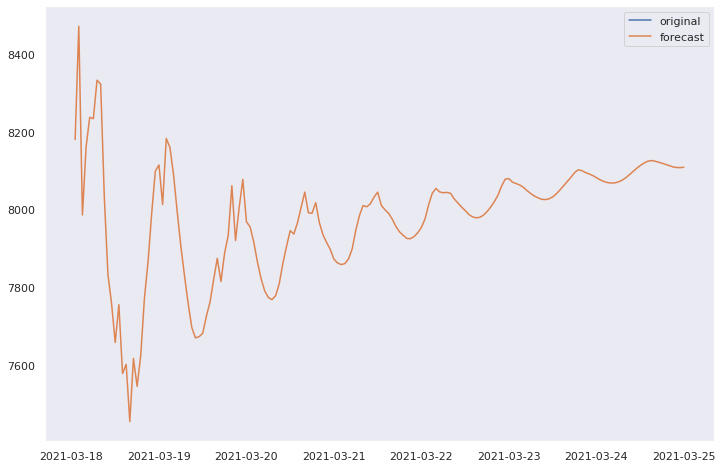

In [115]:
# Ploting packages
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

# Date wrangling
from datetime import datetime, timedelta
import pandas as pd 
import numpy as np

# Deep learning: 
from keras.models import Sequential
from keras.layers import LSTM, Dense

class DeepModelTS():
    """
    A class to create a deep time series model
    """
    def __init__(
        self, 
        data: pd.DataFrame, 
        Y_var: str,
        lag: int,
        LSTM_layer_depth: int, 
        epochs=100, 
        batch_size=256,
        train_test_split=0
    ):

        self.data = data 
        self.Y_var = Y_var 
        self.lag = lag 
        self.LSTM_layer_depth = LSTM_layer_depth
        self.batch_size = batch_size
        self.epochs = epochs
        self.train_test_split = train_test_split

    @staticmethod
    def create_X_Y(ts: list, lag: int) -> tuple:
        """
        A method to create X and Y matrix from a time series list for the training of 
        deep learning models 
        """
        X, Y = [], []

        if len(ts) - lag <= 0:
            X.append(ts)
        else:
            for i in range(len(ts) - lag):
                Y.append(ts[i + lag])
                X.append(ts[i:(i + lag)])

        X, Y = np.array(X), np.array(Y)

        # Reshaping the X array to an LSTM input shape 
        X = np.reshape(X, (X.shape[0], X.shape[1], 1))

        return X, Y         

    def create_data_for_NN(
        self,
        use_last_n=None
        ):
        """
        A method to create data for the neural network model
        """
        # Extracting the main variable we want to model/forecast
        y = self.data[self.Y_var].tolist()

        # Subseting the time series if needed
        if use_last_n is not None:
            y = y[-use_last_n:]

        # The X matrix will hold the lags of Y 
        X, Y = self.create_X_Y(y, self.lag)

        # Creating training and test sets 
        X_train = X
        X_test = []

        Y_train = Y
        Y_test = []

        if self.train_test_split > 0:
            index = round(len(X) * self.train_test_split)
            X_train = X[:(len(X) - index)]
            X_test = X[-index:]     
            
            Y_train = Y[:(len(X) - index)]
            Y_test = Y[-index:]

        return X_train, X_test, Y_train, Y_test

    def LSTModel(self):
        """
        A method to fit the LSTM model 
        """
        # Getting the data 
        X_train, X_test, Y_train, Y_test = self.create_data_for_NN()

        # Defining the model
        model = Sequential()
        model.add(LSTM(self.LSTM_layer_depth, activation='relu', input_shape=(self.lag, 1)))
        model.add(Dense(1))
        model.compile(optimizer='adam', loss='mse')

        # Defining the model parameter dict 
        keras_dict = {
            'x': X_train,
            'y': Y_train,
            'batch_size': self.batch_size,
            'epochs': self.epochs,
            'shuffle': False
        }

        if self.train_test_split > 0:
            keras_dict.update({
                'validation_data': (X_test, Y_test)
            })

        # Fitting the model 
        model.fit(
            **keras_dict
        )

        # Saving the model to the class 
        self.model = model

        return model
        #return model, X_train, X_test, Y_train, Y_test

    def predict(self) -> list:
        """
        A method to predict using the test data used in creating the class
        """
        yhat = []

        if(self.train_test_split > 0):
        
            # Getting the last n time series 
            _, X_test, _, _ = self.create_data_for_NN()        

            # Making the prediction list 
            yhat = [y[0] for y in self.model.predict(X_test)]

        return yhat

    def predict_n_ahead(self, n_ahead: int):
        """
        A method to predict n time steps ahead
        """    
        X, _, _, _ = self.create_data_for_NN(use_last_n=self.lag)        

        # Making the prediction list 
        yhat = []

        for _ in range(n_ahead):
            # Making the prediction
            fc = self.model.predict(X)
            yhat.append(fc)

            # Creating a new input matrix for forecasting
            X = np.append(X, fc)

            # Ommiting the first variable
            X = np.delete(X, 0)

            # Reshaping for the next iteration
            X = np.reshape(X, (1, len(X), 1))

        return yhat


# Reading the data 
# d = pd.read_csv('DAYTON_hourly.csv')
# d['Datetime'] = [datetime.strptime(x, '%Y-%m-%d %H:%M:%S') for x in d['Datetime']]

# # Making sure there are no duplicated data
# # If there are some duplicates we average the data during those duplicated days
# d = d.groupby('Datetime', as_index=False)['DAYTON_MW'].mean()

# # Sorting the values
# d.sort_values('Datetime', inplace=True)
# print('d: ',d)

# Data
d = df_final_onehot

# Initiating the class 
deep_learner = DeepModelTS(
    data = d, 
    Y_var = 'TOTALDEMAND',
    lag = 24,
    LSTM_layer_depth = 64,
    epochs = 1,
    train_test_split = 0.10 # The share of data that will be used for validation
)

# Fitting the model 
model = deep_learner.LSTModel()
#model, X_train, X_test, y_train, y_test = deep_learner.LSTModel()

# Making the prediction on the validation set
# Only applicable if train_test_split in the conf.yml > 0
yhat = deep_learner.predict()

if len(yhat) > 0:

    # Constructing the forecast dataframe
    fc = d.tail(len(yhat)).copy()
    fc.reset_index(inplace=True)
    fc['forecast'] = yhat

'''
    # Ploting the forecasts
    plt.figure(figsize=(12, 8))
    for dtype in ['TOTALDEMAND', 'forecast']:
        plt.plot(
            'Datetime',
            dtype,
            data=fc,
            label=dtype,
            alpha=0.8
        )
    plt.legend()
    plt.grid()
    plt.show()   
'''

# # Forecasting n steps ahead   

# Creating the model using full data and forecasting n steps ahead
deep_learner = DeepModelTS(
    data=d, 
    Y_var='TOTALDEMAND',
    lag=24,
    LSTM_layer_depth=64,
    epochs=1,
    train_test_split=0 
)

# Fitting the model 
deep_learner.LSTModel()

# Forecasting n steps ahead
n_ahead = 168
yhat = deep_learner.predict_n_ahead(n_ahead)
yhat = [y[0][0] for y in yhat]

# Constructing the forecast dataframe
fc = d.tail(400).copy()
#print('fc: ',fc)
#fc['type'] = 'original'
fc.insert(62,'type','original')
#print('fc type: ',fc['type'])
#print('fc insert: ',fc)

#last_date = max(fc['DATETIME'])
last_date = fc.index.max()
#print('last_date: ',last_date)

hat_frame = pd.DataFrame({
    'Datetime': [last_date + timedelta(hours=x + 1) for x in range(n_ahead)], 
    'TOTALDEMAND': yhat,
    'type': 'forecast'
})

fc = fc.append(hat_frame)
fc.reset_index(inplace=True, drop=True)

# Ploting the forecasts 
plt.figure(figsize=(12, 8))
for col_type in ['original', 'forecast']:
    plt.plot(
        'Datetime', 
        'TOTALDEMAND', 
        data=fc[fc['type']==col_type],
        label=col_type
        )

plt.legend()
plt.grid()
plt.show()

#### RMSE

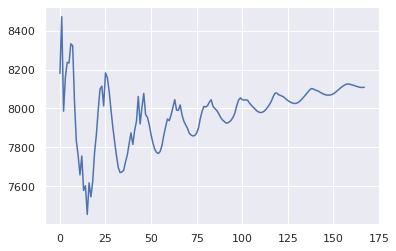

In [130]:
# y_train.shape #(145045,)
# y_test.shape #(16116,)
y_predict_np = np.array(yhat) 
y_predict_np.shape #
# y_hat

plt.plot(yhat)

In [131]:
y_predict = yhat
y_predict
# train_rmse_lstm = rmse(y_predict, y_train) 
# test_rmse_lstm = rmse(y_predict, y_test) 

# print(train_acc, test_acc) 
# print('Train RMSE: {}\nTest RMSE: {}'.format(train_rmse_lstm, test_rmse_lstm) )

[8180.6587,
 8472.132,
 7986.3857,
 8160.859,
 8237.725,
 8234.2,
 8333.053,
 8323.3,
 8033.5776,
 7833.027,
 7757.9224,
 7658.2705,
 7755.5366,
 7578.399,
 7602.1816,
 7454.9736,
 7617.322,
 7545.515,
 7625.37,
 7771.2417,
 7866.0693,
 7989.8784,
 8099.61,
 8115.0596,
 8013.284,
 8183.3735,
 8160.3438,
 8090.1484,
 7994.8076,
 7906.2085,
 7830.3315,
 7759.4033,
 7697.122,
 7670.2876,
 7673.1553,
 7682.1797,
 7725.5977,
 7762.114,
 7820.256,
 7874.778,
 7815.3223,
 7887.7427,
 7933.9395,
 8061.6636,
 7920.5527,
 8005.2026,
 8077.9175,
 7968.836,
 7955.7593,
 7917.0693,
 7866.036,
 7822.8965,
 7791.3066,
 7774.1987,
 7768.5293,
 7778.7837,
 7809.881,
 7862.438,
 7906.082,
 7946.07,
 7937.394,
 7966.569,
 8006.246,
 8045.2944,
 7992.0557,
 7990.819,
 8018.2983,
 7966.8438,
 7935.2026,
 7915.6104,
 7897.685,
 7872.7124,
 7862.8975,
 7858.8325,
 7861.2427,
 7873.384,
 7898.8706,
 7947.1206,
 7985.073,
 8010.6543,
 8007.462,
 8015.2876,
 8032.3936,
 8045.1743,
 8011.2275,
 7999.815,
 7990.6

Temp

In [ ]:
# # LSTM for international airline passengers problem with regression framing
# import numpy
# import matplotlib.pyplot as plt
# from pandas import read_csv
# import math
# from keras.models import Sequential
# from keras.layers import Dense
# from keras.layers import LSTM
# from sklearn.preprocessing import MinMaxScaler
# from sklearn.metrics import mean_squared_error
# # convert an array of values into a dataset matrix
# def create_dataset(dataset, look_back=1):
# 	dataX, dataY = [], []
# 	for i in range(len(dataset)-look_back-1):
# 		a = dataset[i:(i+look_back), 0]
# 		dataX.append(a)
# 		dataY.append(dataset[i + look_back, 0])
# 	return numpy.array(dataX), numpy.array(dataY)

# # Initialise 
# epochs = 1

# # fix random seed for reproducibility
# numpy.random.seed(7)
# # load the dataset
# dataset = df_final_onehot
# # dataset = dataframe.values
# # dataset = dataset.astype('float32')
# # normalize the dataset
# scaler = MinMaxScaler(feature_range=(0, 1))
# dataset = scaler.fit_transform(dataset)
# # split into train and test sets
# train_size = int(len(dataset) * 0.67)
# test_size = len(dataset) - train_size
# train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
# # reshape into X=t and Y=t+1
# look_back = 62
# trainX, trainY = create_dataset(train, look_back)
# testX, testY = create_dataset(test, look_back)
# # reshape input to be [samples, time steps, features]
# trainX = numpy.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
# testX = numpy.reshape(testX, (testX.shape[0], 1, testX.shape[1]))
# # create and fit the LSTM network
# model = Sequential()
# model.add(LSTM(4, input_shape=(1, look_back)))
# model.add(Dense(1))
# model.compile(loss='mean_squared_error', optimizer='adam')
# model.fit(trainX, trainY, epochs=epochs, batch_size=1, verbose=2)
# # make predictions
# trainPredict = model.predict(trainX)
# testPredict = model.predict(testX)



In [ ]:
# # create empty table with 62 fields
# trainPredict_dataset_like = np.zeros(shape=(len(trainPredict), 62) )
# # put the predicted values in the right field
# trainPredict_dataset_like[:,0] = trainPredict[:,0]
# # inverse transform and then select the right field
# trainPredict = scaler.inverse_transform(trainPredict_dataset_like)[:,0]


# # create empty table with 62 fields
# testPredict_dataset_like = np.zeros(shape=(len(testPredict), 62) )
# # put the predicted values in the right field
# testPredict_dataset_like[:,0] = testPredict[:,0]
# # inverse transform and then select the right field
# testPredict = scaler.inverse_transform(testPredict_dataset_like)[:,0]


# invert predictions
# trainPredict = scaler.inverse_transform(trainPredict)
# trainY = scaler.inverse_transform([trainY])
# testPredict = scaler.inverse_transform(testPredict)
# testY = scaler.inverse_transform([testY])


In [ ]:
# # calculate root mean squared error
# trainScore = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
# print('Train Score: %.2f RMSE' % (trainScore))
# testScore = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
# print('Test Score: %.2f RMSE' % (testScore))
# # shift train predictions for plotting
# trainPredictPlot = numpy.empty_like(dataset)
# trainPredictPlot[:, :] = numpy.nan
# trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
# # shift test predictions for plotting
# testPredictPlot = numpy.empty_like(dataset)
# testPredictPlot[:, :] = numpy.nan
# testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict
# # plot baseline and predictions
# plt.plot(scaler.inverse_transform(dataset))
# plt.plot(trainPredictPlot)
# plt.plot(testPredictPlot)
# plt.show()

Temp

In [ ]:

# #importing the packages
# import pandas as pd
# import numpy as np
# import matplotlib.pyplot as plt
# from matplotlib.pylab import rcParams
# from sklearn.preprocessing import MinMaxScaler

# #used for setting the output figure size
# rcParams['figure.figsize'] = 20,10

# #importing the packages 
# from sklearn.preprocessing import MinMaxScaler
# from keras.models import Sequential
# from keras.layers import Dense, Dropout, LSTM

# X_train, y_train = np.array(X_train), np.array(y_train)
# X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

# #LSTM neural network
# lstm_model = Sequential()
# lstm_model.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1],1)))
# lstm_model.add(LSTM(units=50))
# lstm_model.add(Dense(1))
# lstm_model.compile(loss='mean_squared_error', optimizer='adadelta')
# lstm_model.fit(X_train, y_train, epochs=3, batch_size=1, verbose=2)

## Calculate Target Accuracy
Calculat RMSE on Forcast and Total from complete dataset

In [ ]:

#targetaccuracy = rmse(forecast,total)
targetaccuracy = rmse(df_final['FORECASTDEMAND'],df_final['TOTALDEMAND'])
print(targetaccuracy)
# RMSE: 85.87  (including pre-2012)
# RMSE: 77.67 (excluding pre-2012)

## Other sandpit models
* Linear regression
* Keras
* Pytorch

In [ ]:

# from sklearn.linear_model import LinearRegression
# from sklearn.metrics import mean_squared_error

# #reg = LinearRegression().fit(X_train, y_train["TOTALDEMAND"])
# reg = LinearRegression().fit(X_train, y_train)
# y_train_pred = reg.predict(X_train)
# y_test_pred = reg.predict(X_test)

# RMSE_train = np.sqrt(mean_squared_error(y_train['TOTALDEMAND'], p_train))
# RMSE_test = np.sqrt(mean_squared_error(y_test['TOTALDEMAND'], p_test))

# print('Train RMSE: {}\nTest RMSE: {}'.format(RMSE_train, RMSE_test) )

In [ ]:

def summarized_scores(name,score,scores):
    s_scores=', '.join(['%.1f'%s for s in scores])
    print('%s:[%.3f] %s'%(name,score,s_scores))

In [ ]:

def to_supervized(train,n_in,n_out):
    data=train.reshape((train.shape[0]*train.shape[1],train.shape[2]))
    X,y=[],[]
    in_start=0
    for i in range(len(data)):
        in_end=in_start+n_in
        out_end=in_end+n_out
        if out_end<len(data):
            x_in=data[in_start:in_end,0]
            x_in=x_in.reshape((len(x_in),1))
            X.append(x_in)
            y.append(data[in_end:out_end,0])
        in_start+=1
    return np.array(X),np.array(y)

In [ ]:

from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import LSTM

In [ ]:

def build_model(train,n_input):
    train_x,train_y=to_supervized(train,n_input,7)
    verbose=0
    epochs=70
    batch_size=16
    n_timesteps=train_x.shape[1]
    n_features=train_x.shape[2]
    n_outputs=train_y.shape[1]
    model=Sequential()
    model.add(LSTM(200,activation='relu',input_shape=(n_timesteps,n_features)))
    model.add(Dense(100,activation='relu'))
    model.add(Dense(n_outputs))
    model.compile(loss='mse',optimizer='adam')
    model.fit(train_x,train_y,epochs=epochs,batch_size=batch_size,verbose=verbose)
    return model

In [ ]:

def forecast(model,history,n_input):
    data=np.array(history)
    data=data.reshape((data.shape[0]*data.shape[1],data.shape[2]))
    in_x=data[-n_input:,0]
    in_x=in_x.reshape((1,len(in_x),1))
    yhat=model.predict(in_x,verbose=0)
    return yhat[0]

In [ ]:

def evaluate_model(train,test,n_input):
    model=build_model(train,n_input)
    history=[x for x in train]
    prediction=[]
    for i in range(len(test)):
        yhat_s=forecast(model,history,n_input)
        prediction.append(yhat_s)
        history.append(test[i,:])
    prediction=np.array(prediction)
    score,scores=forecasts(test[:,:,0],prediction)
    return score,scores

In [ ]:

# X = df_forecast
# y = 
# # Split train and test data
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 25)

# train,test=split(df_final.values)

# WIP (Work in progress)
2. Plot predicted output
3. No onehot for LSTM
4. Add LSTM model
5. Add GRU model

#TO DO!!!
1. Add business hours feature, low/medium/ 
2. Add colours to V shape group for weekday and weekend = DONE
3. get the date and time of the top 100 biggest errors ? 
4. Bushfire events = view, not match
5. Solar data - James
6. Daylight data
7. Cloud cover data - https://www.earthenv.org/cloud
8. Need to group business hour?
9. Regression for significances

# DONE
1. Add season/quarter feature = DONE (not improve RMSE)
2. High, low temperature = = DONE (small improvement of RMSE)
3. One hot encoding a version of “hour” or “30”mins = DONE (improve RMSE from 75 to 74.77)
4. Get baseslines RMSE = 75
5. Add public holidays
6. Add public holidays work day, non-weekday as categorical
7. Train test split by date ranges, not random

In [ ]:

# # Generate 'business hour' feature

# for i in range(len(df_forecast)):
#     position = df_forecast.index[i]
#     hour = position.hour
#     if ((hour > 8 and hour < 12) or (hour > 14 and hour < 21)):
#         df_forecast.loc[position, 'business hour'] = 2
#     elif (hour >= 12 and hour <= 14):
#         df_forecast.loc[position, 'business hour'] = 1
#     else:
#         df_forecast.loc[position, 'business hour'] = 0